## Importing the libraries

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import warnings

# ignore all warnings
warnings.filterwarnings("ignore")

## Load and Prepare Data

In this data, we have to make a model so that it can predict the value of count based on the values of each column

In [2]:
df=pd.read_csv('C:/Users/pc/Downloads/Video/Mini Project 2 - Regression (Bike Sharing Demand)/train.csv')
df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0,0,1,1


## EDA

##### We try to make ourselves aware of the relationship between the columns before doing anything on our data
##### As you can see, most of the columns have a number type, in the following, we will try to convert the datetime column to a number in a way so that it has the most efficiency.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [4]:
rows, columns = df.shape
print(f"تعداد ردیف‌ها: {rows}, تعداد ستون‌ها: {columns}")

تعداد ردیف‌ها: 10886, تعداد ستون‌ها: 12


In [5]:
df.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count'],
      dtype='object')

In [6]:
df.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


#### In our quick review of the number of columns. Sets, averages, etc., we are aware of our data, it is better to find the uniqe value of each column in order to deal with our data according to it.

In [7]:
for colunm in df.columns:
    uniq=df[colunm].nunique()
    print (f'{colunm}: {uniq} مقدار یکتا')

datetime: 10886 مقدار یکتا
season: 4 مقدار یکتا
holiday: 2 مقدار یکتا
workingday: 2 مقدار یکتا
weather: 4 مقدار یکتا
temp: 49 مقدار یکتا
atemp: 60 مقدار یکتا
humidity: 89 مقدار یکتا
windspeed: 28 مقدار یکتا
casual: 309 مقدار یکتا
registered: 731 مقدار یکتا
count: 822 مقدار یکتا


#### Let's take a look at the features that have the highest count by sorting the data based on the highest count

In [8]:
df.sort_values( 'count',ascending=False) .head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
9345,2012-09-12 18:00:00,3,0,1,1,27.06,31.060,44,16.9979,91,886,977
9320,2012-09-11 17:00:00,3,0,1,1,28.70,31.820,28,0.0000,168,802,970
9297,2012-09-10 18:00:00,3,0,1,1,25.42,31.060,35,19.9995,111,857,968
9752,2012-10-10 17:00:00,4,0,1,1,23.78,27.275,43,15.0013,91,857,948
9896,2012-10-16 17:00:00,4,0,1,1,21.32,25.000,39,12.9980,104,839,943


#### Now let's make a pivot based on season and weather with count value and see how much our total count was in each weather and season.We will discuss this part more with Visualize in the future

In [9]:
df.pivot_table(index = 'season', columns = 'weather', values = 'count', \
               aggfunc = 'sum', fill_value = 0)

weather,1,2,3,4
season,,,,
1,223009,76406,12919,164
2,426350,134177,27755,0
3,470116,139386,31160,0
4,356588,157191,30255,0


#### Here we can see what percentage of working days we have had in each season

In [10]:
pd.crosstab( df.season, df.workingday,normalize='index' )

workingday,0,1
season,,
1,0.319434,0.680566
2,0.307355,0.692645
3,0.324918,0.675082
4,0.324799,0.675201


#### Now let's make a pivot based on holiday and workingday with count value and see how much our total count was in each holiday and workingday.As you can see, working days that are not holidays have the highest number of bicycle rentals, and obviously there is no day that is both a holiday and a working day, that's why you see zero in the table.

In [11]:
df.pivot_table(index = 'holiday', columns = 'workingday', values = 'count', \
               aggfunc = 'sum', fill_value = 0)

workingday,0,1
holiday,,
0,597064,1430604
1,57808,0


#### You can see the same table as a percentage

In [12]:
df_sub = df.groupby(['holiday', 'workingday'])['count'].sum().reset_index()
df_sub['% of Total'] = (df_sub['count'] / df_sub['count'].sum() * 100).round(1).astype(str) + '%'
df_sub['% of workingday'] = (df_sub['count'] / df_sub.groupby('holiday')['count'].transform('sum') * 100).round(1).astype(str) + '%'
df_sub

,holiday,workingday,count,% of Total,% of workingday
0,0,0,597064,28.6%,29.4%
1,0,1,1430604,68.6%,70.6%
2,1,0,57808,2.8%,100.0%


#### Let's take a look at the amount of bike rental we had in each temp. Of course, you shouldn't be limited to temp because other columns are also effective, but by sorting by count, you can generally see how much count each temperature has.As you can see, moderate temperatures like 28 and 29 and around have the highest count, which is logical

In [13]:
# Use agg instead of apply
df.groupby('temp', sort=True, as_index=False).agg({'count': 'sum'}).sort_values('count', ascending=False).head()

,temp,count
34,28.70,110029
31,26.24,105279
35,29.52,98025
29,24.60,92501
36,30.34,90655


#### Now let's see how the wind speed as a feature affects it, and as you can see, it is not a very effective feature. We will examine this issue more in the visualization section.But so far it can be said that if the wind speed is a little lower, the count is higher

In [14]:
# Use agg instead of apply
df.groupby('windspeed', sort=True, as_index=False).agg({'count': 'sum'}).sort_values('count', ascending=False).head()

,windspeed,count
4,11.0014,213791
0,0.0000,211526
5,12.9980,210744
6,15.0013,202611
3,8.9981,196723
7,16.9979,177034
2,7.0015,175627
8,19.0012,147403
1,6.0032,128938
9,19.9995,110816


## Data Preprocessing

#### Let's check our data has null(missing) or not

In [15]:
missing_data = df.isnull().sum()
print(missing_data)

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64


#### As we mentioned before, we have a column called datatime, which needs to be extracted from this column by separating the hour, week, and month from this column to extract appropriate numerical data.

In [16]:
from datetime import datetime # Import datetime class
import calendar
df["date"] = df.datetime.apply(lambda x: x.split()[0])
df["hour"] = df.datetime.apply(lambda x: x.split()[1].split(":")[0])

# Adjust the weekday calculation
df["weekday"] = df.date.apply(lambda dateString: (datetime.strptime(dateString, "%Y-%m-%d").weekday() + 1) % 7 + 1)

# 1 for Sunday, 2 for Monday, ..., 7 for Saturday
df["month"] = df.date.apply(lambda dateString: datetime.strptime(dateString, "%Y-%m-%d").month)

I also separate the data itself, but because it causes confusion in the model and it is not an influence column, I will remove it

In [17]:
df['date'] = pd.to_datetime(df['date'])
# convert the datetime column to an integer column
df['date'] = df['date'].astype(np.int64)
# Convert 'hour' column to float type
df['hour'] = df['hour'].astype(int)

In [18]:
df.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,date,hour,weekday,month
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16,1293840000000000000,0,7,1
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40,1293840000000000000,1,7,1
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32,1293840000000000000,2,7,1
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13,1293840000000000000,3,7,1
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1,1293840000000000000,4,7,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,4,0,1,1,15.58,19.695,50,26.0027,7,329,336,1355875200000000000,19,4,12
10882,2012-12-19 20:00:00,4,0,1,1,14.76,17.425,57,15.0013,10,231,241,1355875200000000000,20,4,12
10883,2012-12-19 21:00:00,4,0,1,1,13.94,15.910,61,15.0013,4,164,168,1355875200000000000,21,4,12
10884,2012-12-19 22:00:00,4,0,1,1,13.94,17.425,61,6.0032,12,117,129,1355875200000000000,22,4,12


#### Since it is better to put the column that the model is going to predict as the last column on the right side for more readability of the dataframe, I also arrange the columns like this.

In [19]:
# Remove column 'count' and store it in a variable
count_col = df.pop ('count')
# Insert column 'count' at the end of the dataframe
df.insert (len (df.columns), 'count', count_col)

You can see the order of the columns

In [20]:
df.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'date',
       'hour', 'weekday', 'month', 'count'],
      dtype='object')

#### It can also be arranged using this method . Reorder the columns by putting 'count' at the end
 df = df [ ['datetime','season', 'holiday', 'workingday', 'weather', 'temp', 'atemp',
       'humidity', 'windspeed', 'casual', 'registered', 'date', 'hour',
       'weekday', 'month', 'count']]

We remove unnecessary and misleading columns
In my opinion, these columns have more negative influence than positive

In [21]:
df.drop(['datetime','date','atemp'],axis=1,inplace=True)
df.head()

,season,holiday,workingday,weather,temp,humidity,windspeed,casual,registered,hour,weekday,month,count
0,1,0,0,1,9.84,81,0.0000,3,13,0,7,1,16
1,1,0,0,1,9.02,80,0.0000,8,32,1,7,1,40
2,1,0,0,1,9.02,80,0.0000,5,27,2,7,1,32
3,1,0,0,1,9.84,75,0.0000,3,10,3,7,1,13
4,1,0,0,1,9.84,75,0.0000,0,1,4,7,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,4,0,1,1,15.58,50,26.0027,7,329,19,4,12,336
10882,4,0,1,1,14.76,57,15.0013,10,231,20,4,12,241
10883,4,0,1,1,13.94,61,15.0013,4,164,21,4,12,168
10884,4,0,1,1,13.94,61,6.0032,12,117,22,4,12,129


Now, as you can see, all the columns have been converted into numbers

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      10886 non-null  int64  
 1   holiday     10886 non-null  int64  
 2   workingday  10886 non-null  int64  
 3   weather     10886 non-null  int64  
 4   temp        10886 non-null  float64
 5   humidity    10886 non-null  int64  
 6   windspeed   10886 non-null  float64
 7   casual      10886 non-null  int64  
 8   registered  10886 non-null  int64  
 9   hour        10886 non-null  int32  
 10  weekday     10886 non-null  int64  
 11  month       10886 non-null  int64  
 12  count       10886 non-null  int64  
dtypes: float64(2), int32(1), int64(10)
memory usage: 1.0 MB


### Now let's use the z scores method to replace the outliers data with the median

In [23]:
from scipy import stats
# Define a list of columns to work on
columns = ['temp', 'humidity','windspeed']
# Calculate the z-scores of each column in the list
z_scores = stats.zscore(df[columns])
# Find the absolute z-scores greater than 3
outliers = np.abs(z_scores) > 3
# Replace the outliers with the median of the column
df[outliers] = np.nan
df.fillna(df.median(), inplace=True)

# Print the cleaned dataframe
df.head()

,season,holiday,workingday,weather,temp,humidity,windspeed,casual,registered,hour,weekday,month,count
0,1,0,0,1,9.84,81.0,0.0000,3,13,0,7,1,16
1,1,0,0,1,9.02,80.0,0.0000,8,32,1,7,1,40
2,1,0,0,1,9.02,80.0,0.0000,5,27,2,7,1,32
3,1,0,0,1,9.84,75.0,0.0000,3,10,3,7,1,13
4,1,0,0,1,9.84,75.0,0.0000,0,1,4,7,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,4,0,1,1,15.58,50.0,26.0027,7,329,19,4,12,336
10882,4,0,1,1,14.76,57.0,15.0013,10,231,20,4,12,241
10883,4,0,1,1,13.94,61.0,15.0013,4,164,21,4,12,168
10884,4,0,1,1,13.94,61.0,6.0032,12,117,22,4,12,129


In [24]:
df.sort_values( 'count',ascending=False).head()

,season,holiday,workingday,weather,temp,humidity,windspeed,casual,registered,hour,weekday,month,count
9345,3,0,1,1,27.06,44.0,16.9979,91,886,18,4,9,977
9320,3,0,1,1,28.70,28.0,0.0000,168,802,17,3,9,970
9297,3,0,1,1,25.42,35.0,19.9995,111,857,18,2,9,968
9752,4,0,1,1,23.78,43.0,15.0013,91,857,17,4,10,948
9896,4,0,1,1,21.32,39.0,12.9980,104,839,17,3,10,943
...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,1,0,1,1,8.20,75.0,8.9981,1,0,4,4,3,1
1853,2,0,1,3,17.22,88.0,35.0008,0,1,3,4,5,1
1589,2,0,1,2,23.78,56.0,8.9981,0,1,3,3,4,1
693,1,0,0,1,4.92,74.0,6.0032,0,1,5,7,2,1


By making a hist, we can see how much each column of each data has

array([[<Axes: title={'center': 'season'}>,
        <Axes: title={'center': 'holiday'}>,
        <Axes: title={'center': 'workingday'}>,
        <Axes: title={'center': 'weather'}>],
       [<Axes: title={'center': 'temp'}>,
        <Axes: title={'center': 'humidity'}>,
        <Axes: title={'center': 'windspeed'}>,
        <Axes: title={'center': 'casual'}>],
       [<Axes: title={'center': 'registered'}>,
        <Axes: title={'center': 'hour'}>,
        <Axes: title={'center': 'weekday'}>,
        <Axes: title={'center': 'month'}>],
       [<Axes: title={'center': 'count'}>, <Axes: >, <Axes: >, <Axes: >]],
      dtype=object)

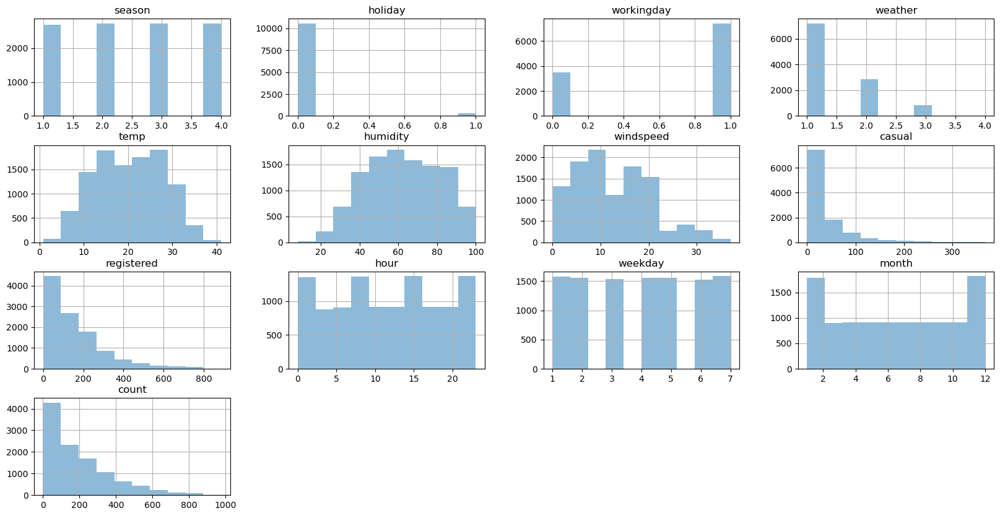

In [25]:
df.hist(alpha=0.5, figsize=(20, 10))

## Strorytelling - Visualization

### By making a corr, let's see how much (percentage) each feature has an effect on the rest of the features

<Axes: >

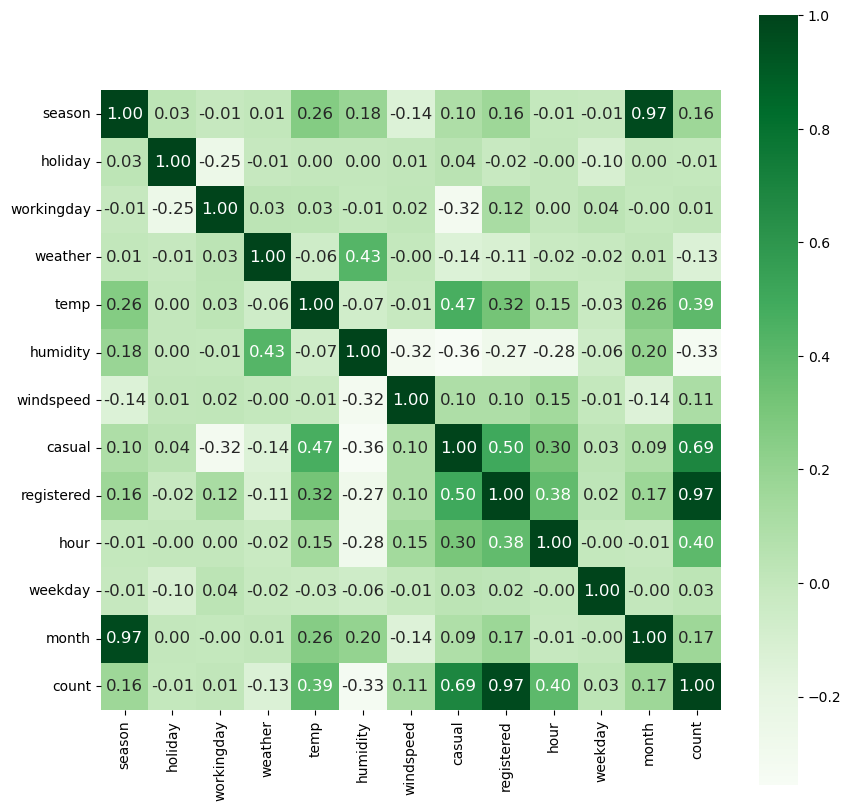

In [26]:
corr=df.corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr,annot=True,cmap='Greens',annot_kws={'size':12},fmt='.2f',square=True,cbar=True)

As you can see, the maximum number of counts in each line starts from zero to the top, or in other words, we rent a small amount each time, and it is rare for us to have 1000 counts per order.

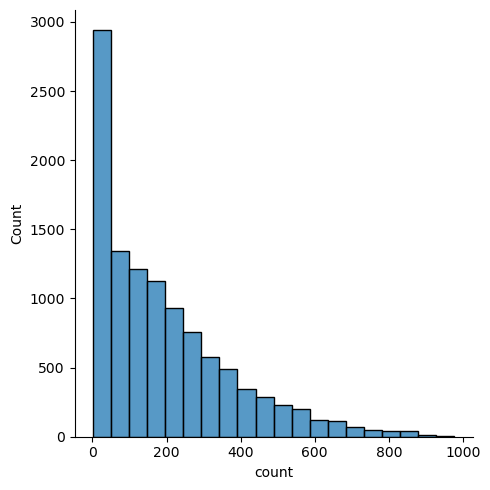

In [27]:
sns.displot(df, x="count",bins=20)

### weather
* 1: Clear, Few clouds, Partly cloudy, Partly cloudy 
* 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist 
* 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds 
* 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
#### As you can see, the more favorable and moderate the weather and the clearer the sky, the more our count is, which is also logical.

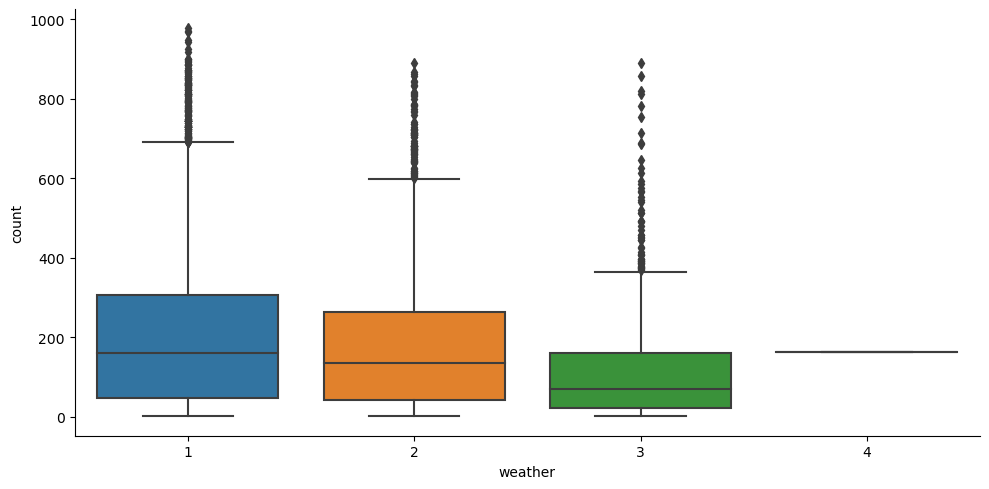

In [28]:
sns.catplot(x='weather', y='count', kind='box' , data=df , aspect=2)

#### You can see how much of each data we have in each column. It is the same hist that we drew above, this time it is clearer and with kde.

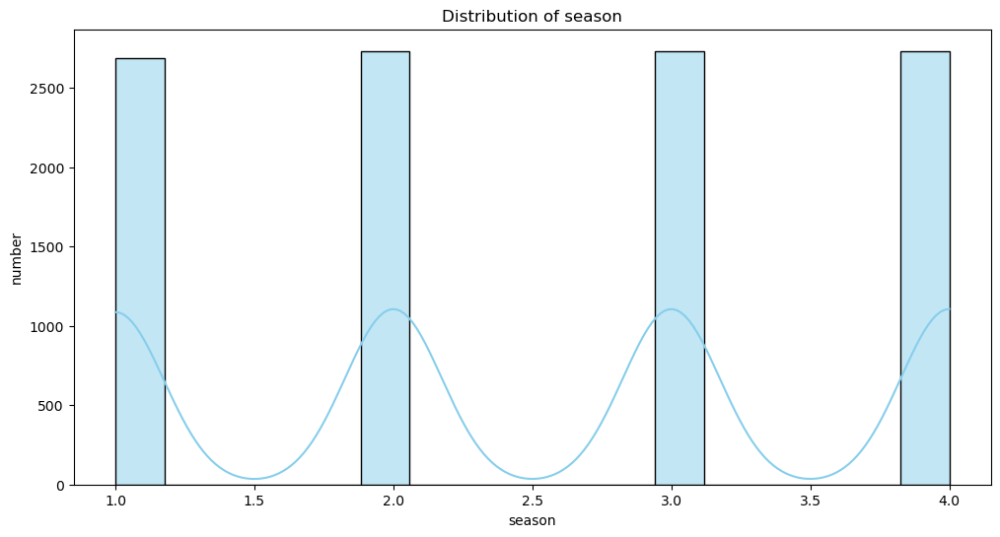

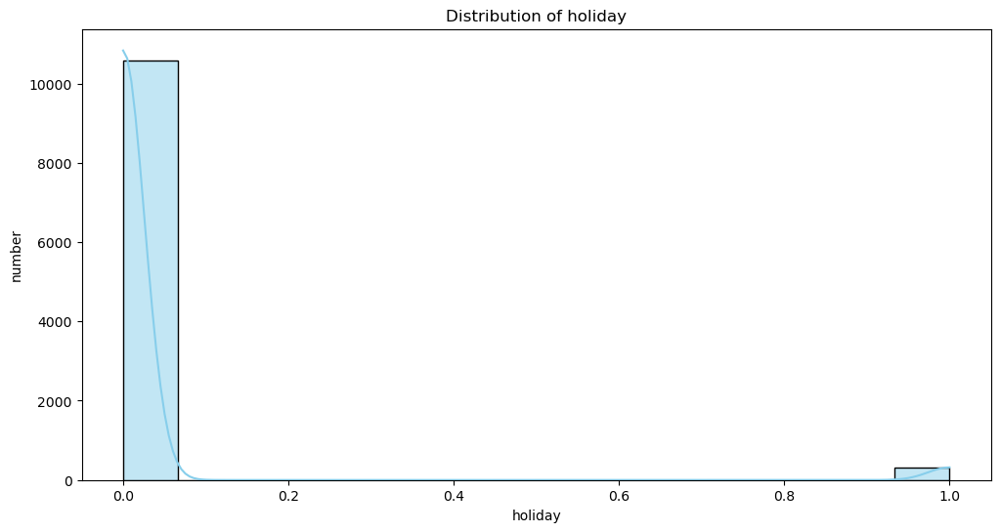

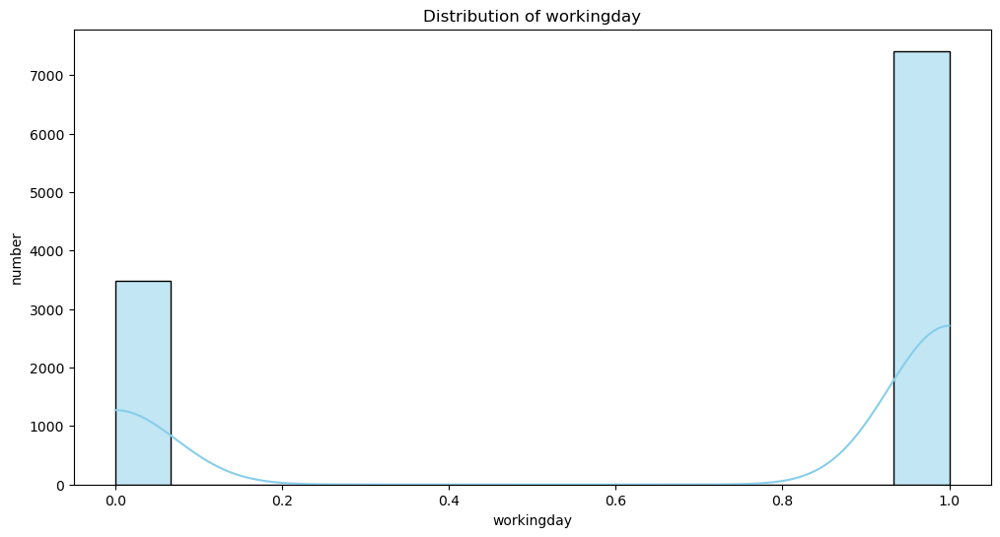

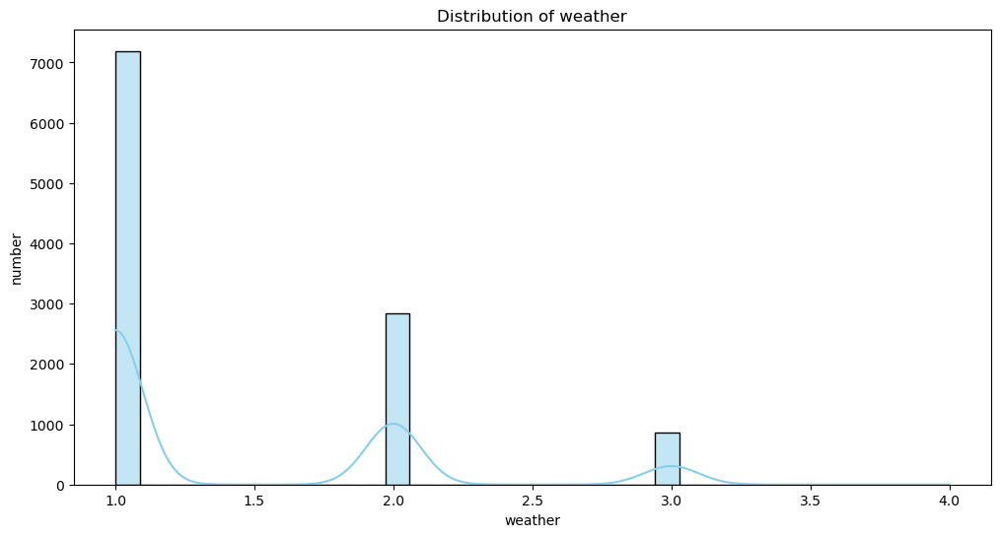

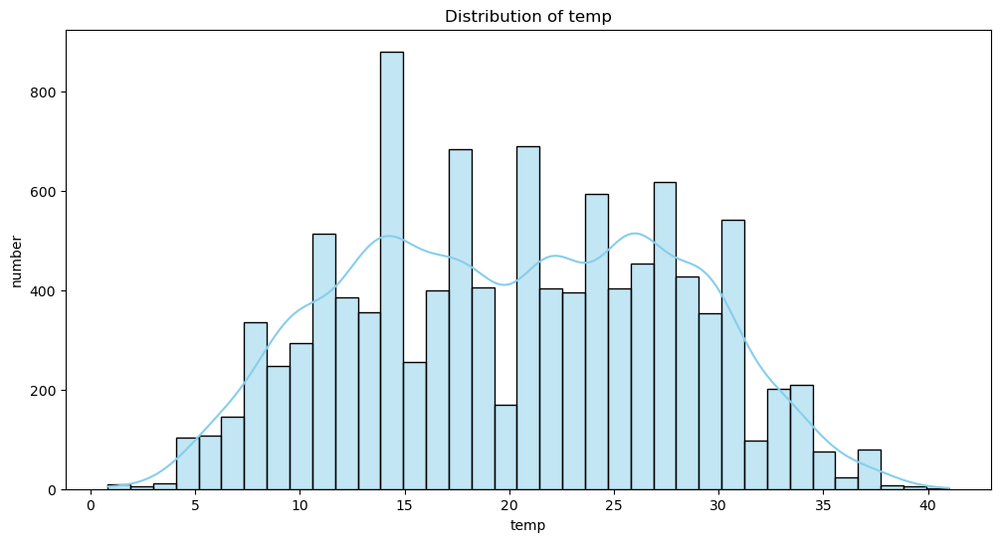

...

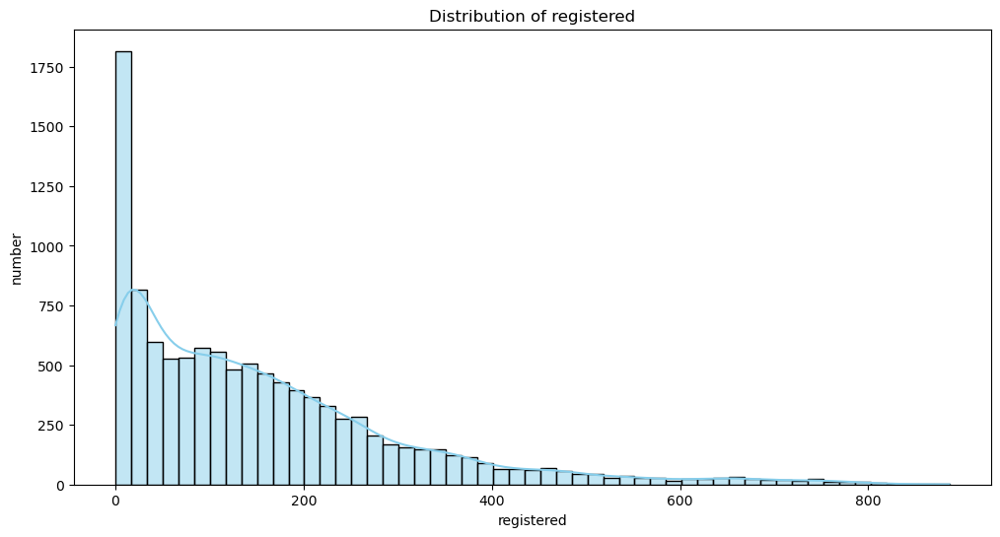

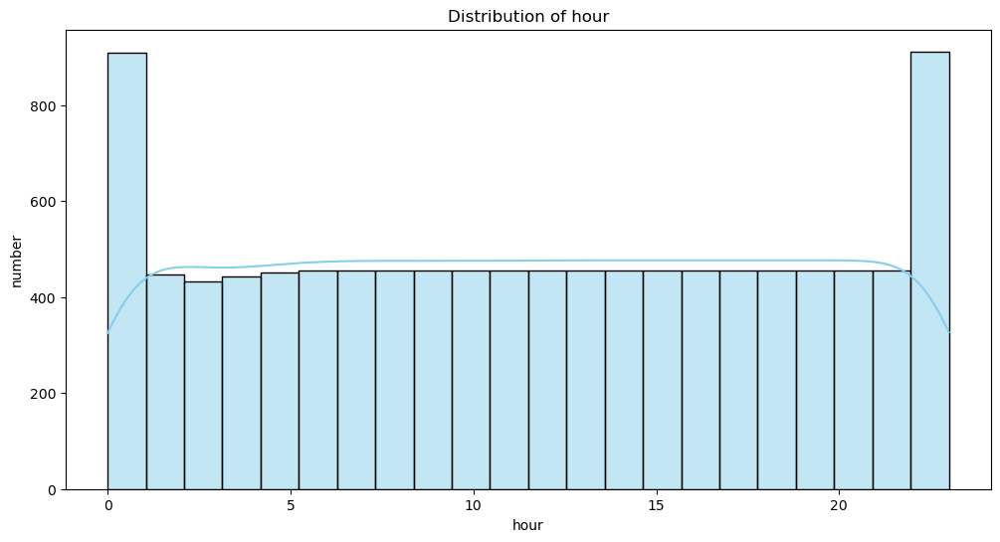

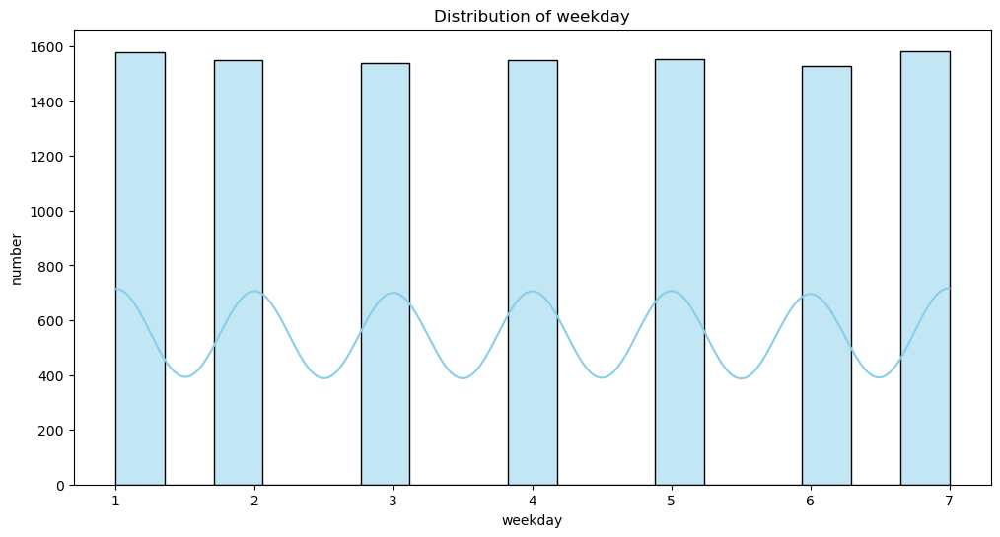

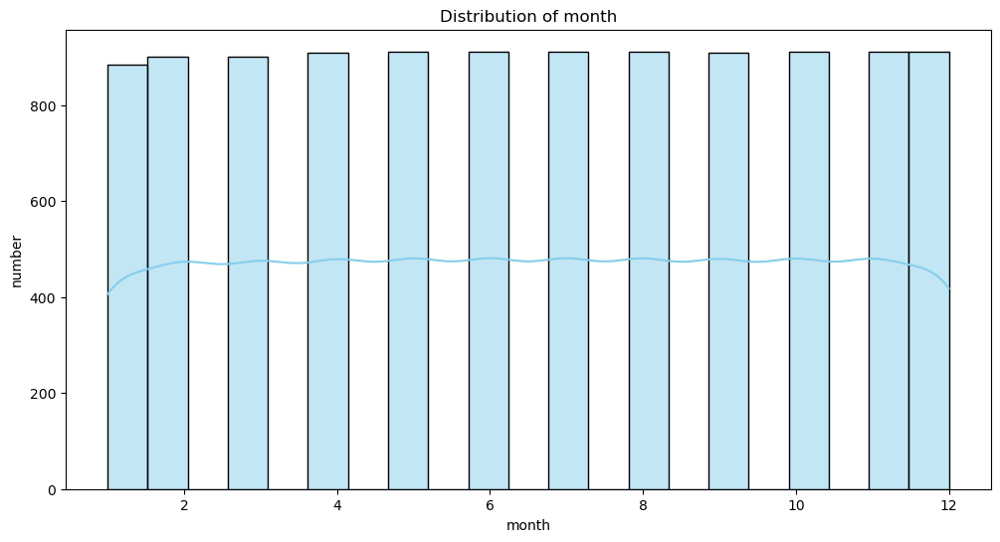

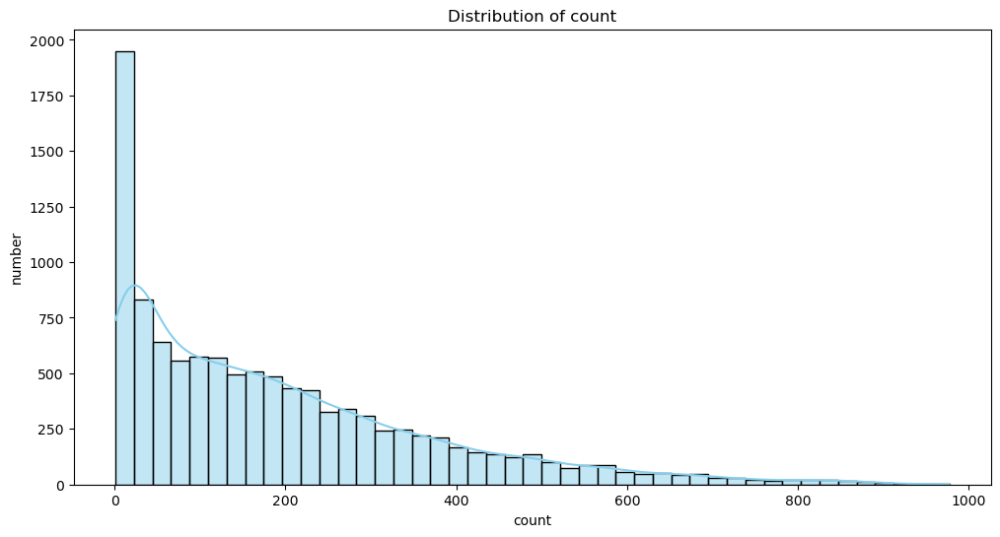

In [29]:
for col in df.columns:
    plt.figure(figsize=(12,6))
    sns.histplot(data=df, x=col, kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.ylabel('number')
    plt.show()

#### datetime - hourly date + timestamp 
#### season 
* 1 = spring,
* 2 = summer, 
* 3 = fall, 
* 4 = winter
#### holiday - whether the day is considered a holiday
#### workingday - whether the day is neither a weekend nor holiday
#### weather 
* - 1: Clear, Few clouds, Partly cloudy, Partly cloudy 
* 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist 
* 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds 
* 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
#### temp - temperature in Celsius
#### atemp - "feels like" temperature in Celsius
#### humidity - relative humidity
#### windspeed - wind speed
#### casual - number of non-registered user rentals initiated
#### registered - number of registered user rentals initiated
#### count - number of total rental

Here you can easily see the effect of each column and its data on the count value
We see the figures of each column on the X-axis and the count on the Y-axis

#### If I want to write the entire analysis of all the graphs, it will be too much and time-consuming. In a general view, everything is clear, for example, the highest amount of rent is in the fall season, and we had more rent on working days, and also in clear and favorable weather. We had the highest amount of count and...

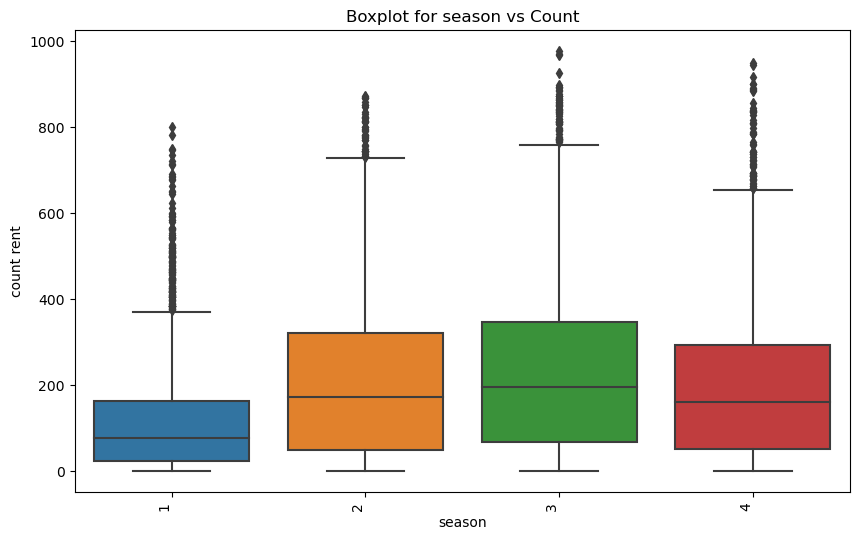

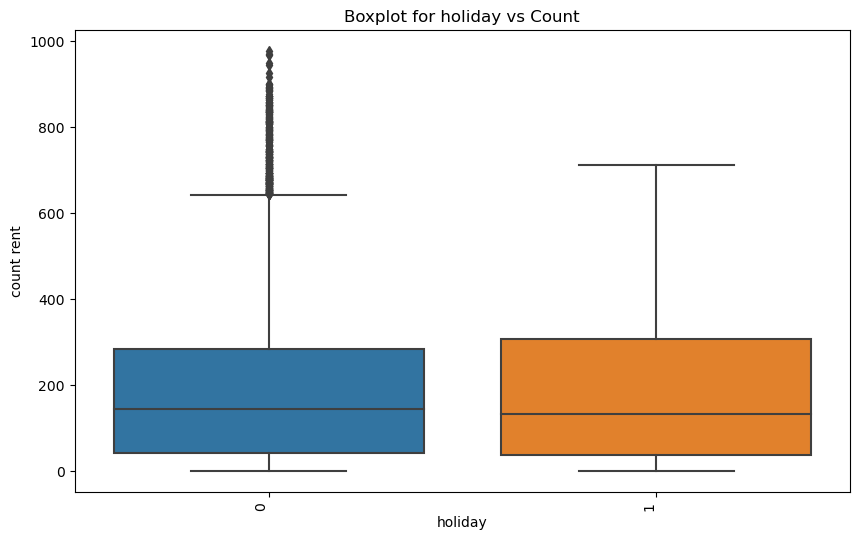

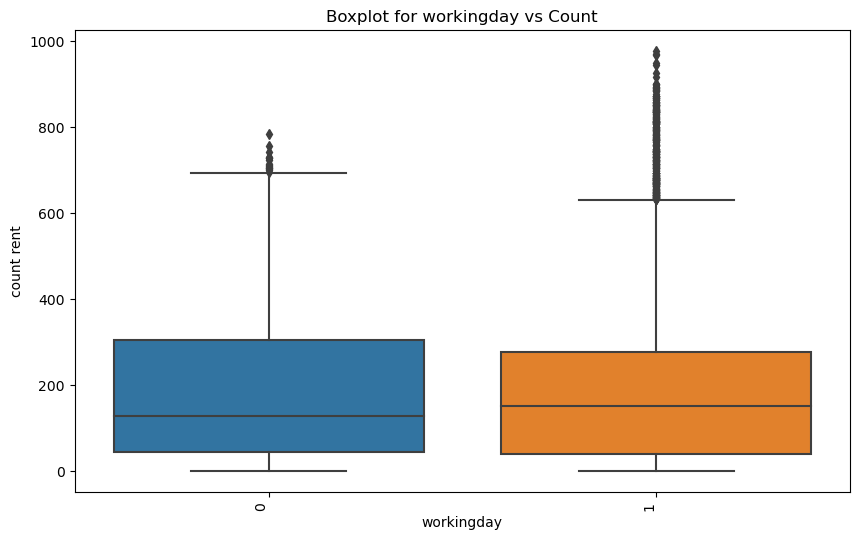

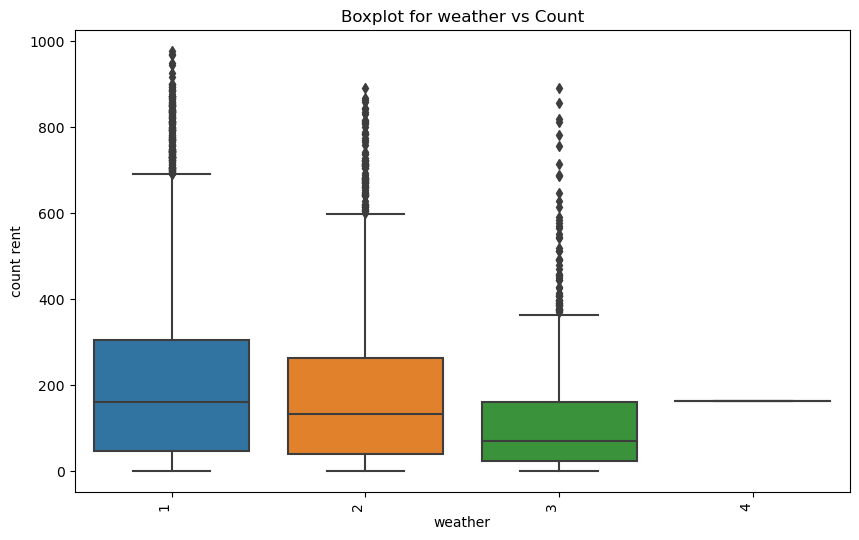

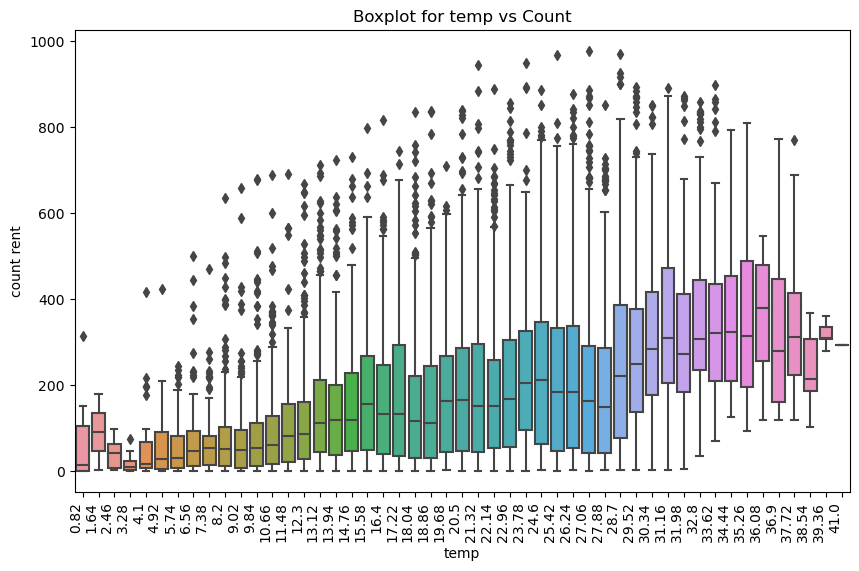

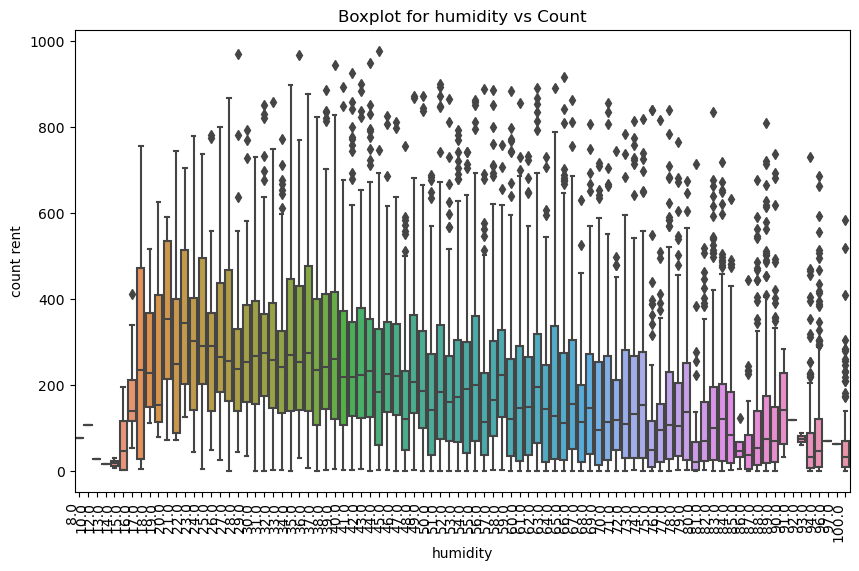

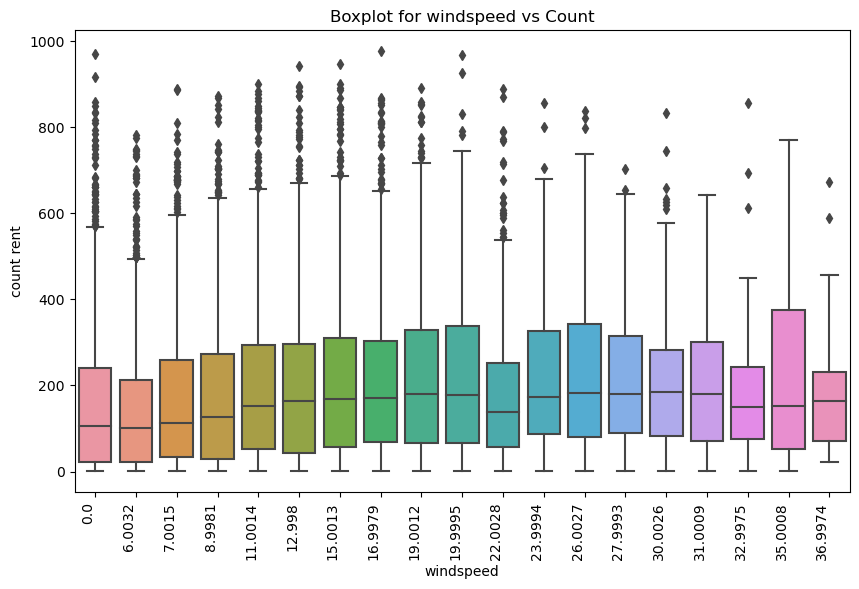

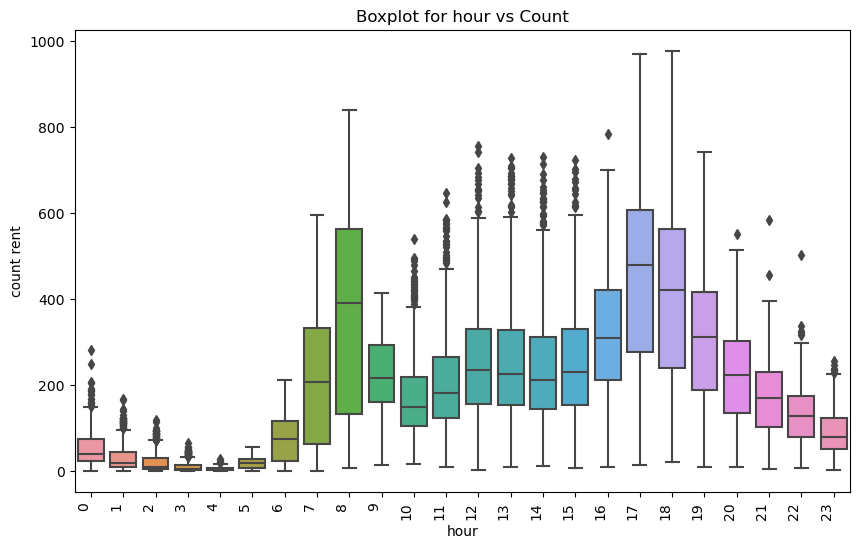

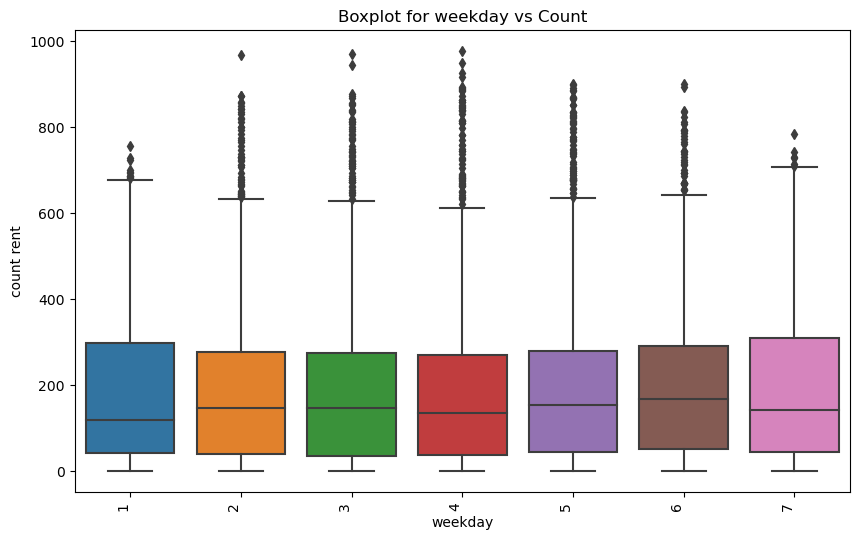

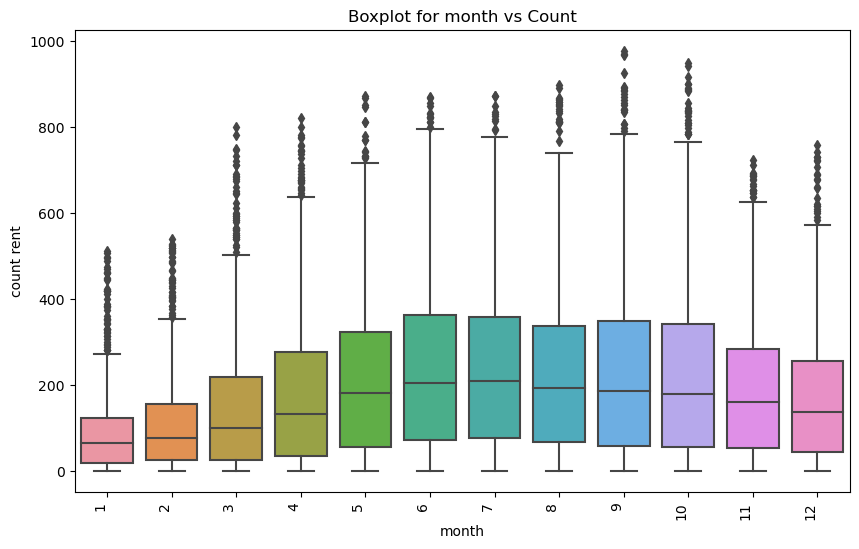

In [30]:
num_cols = ['season', 'holiday', 'workingday', 'weather', 'temp',
                       'humidity', 'windspeed', 'hour',
                       'weekday', 'month']

for column in num_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=column, y='count', data=df)
    
    # Rotate x-axis labels
    plt.xticks(rotation=90, ha='right')
    
    plt.title(f'Boxplot for {column} vs Count')
    plt.ylabel('count rent')
    plt.show()


#### Here you can see a suitable diagram that was drawn using jointplot and you can see the effect of each feature on the count. Does the count increase as this feature increases?

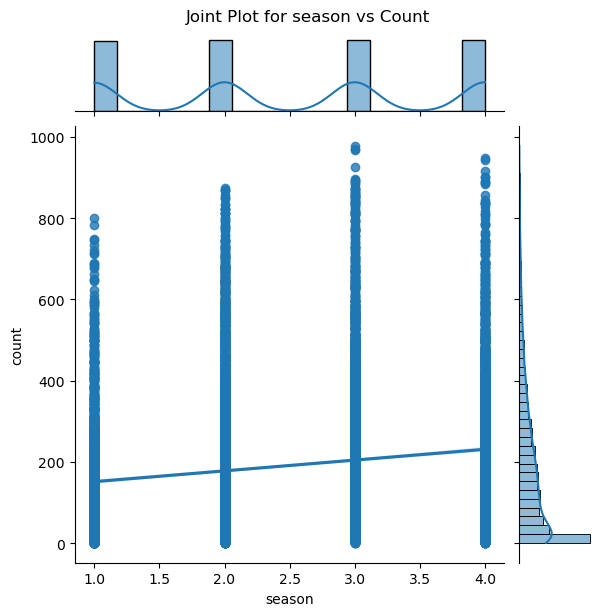

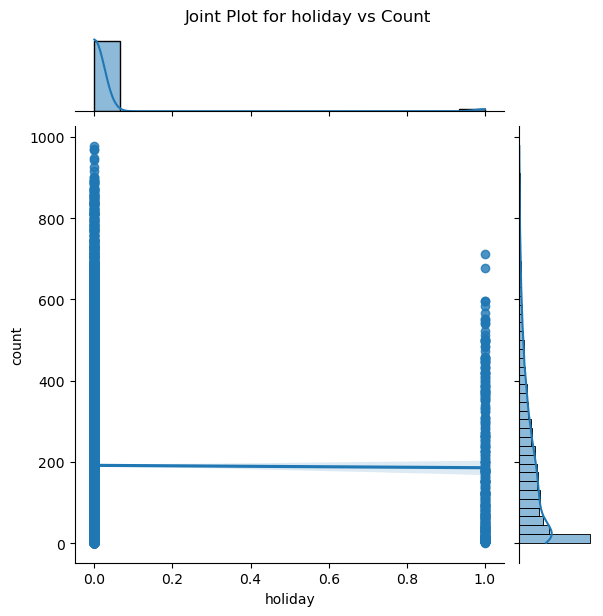

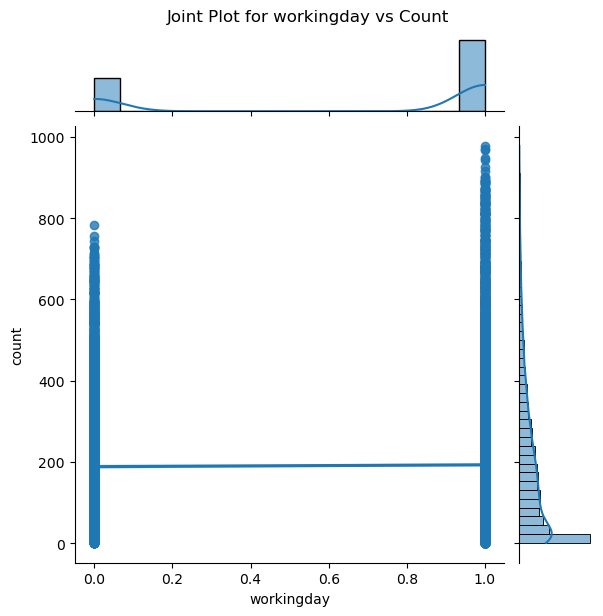

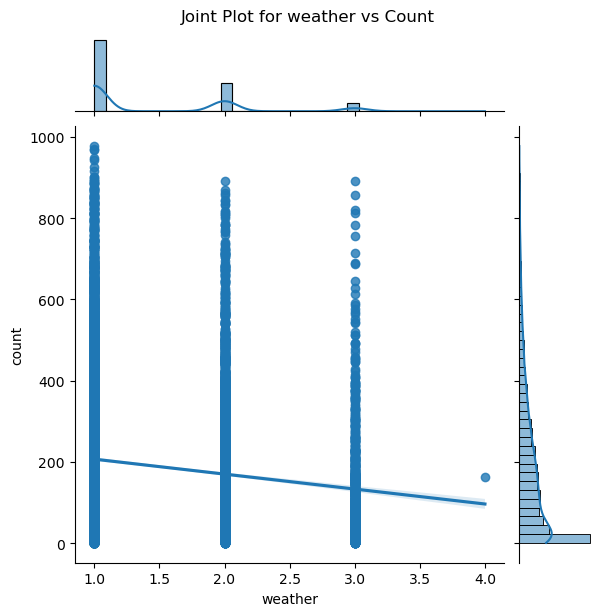

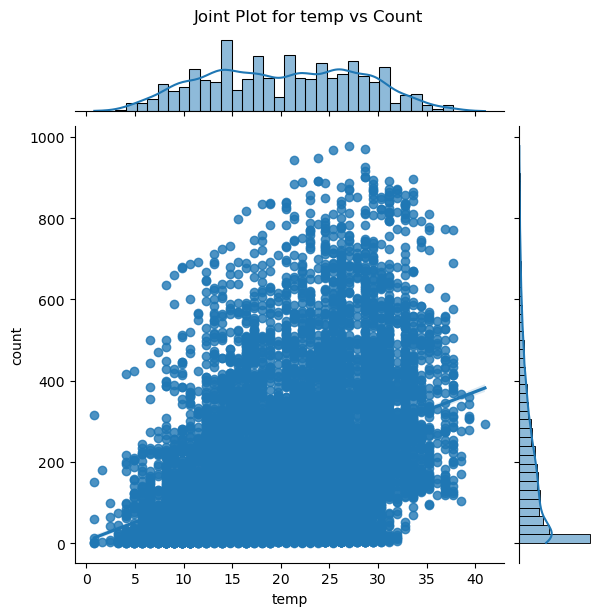

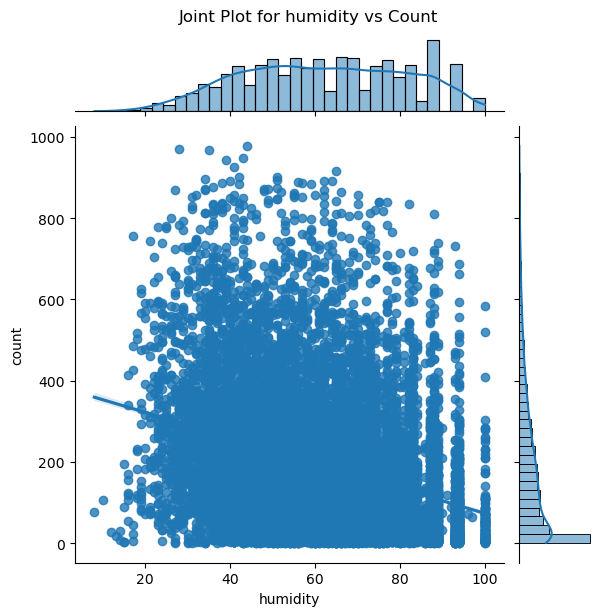

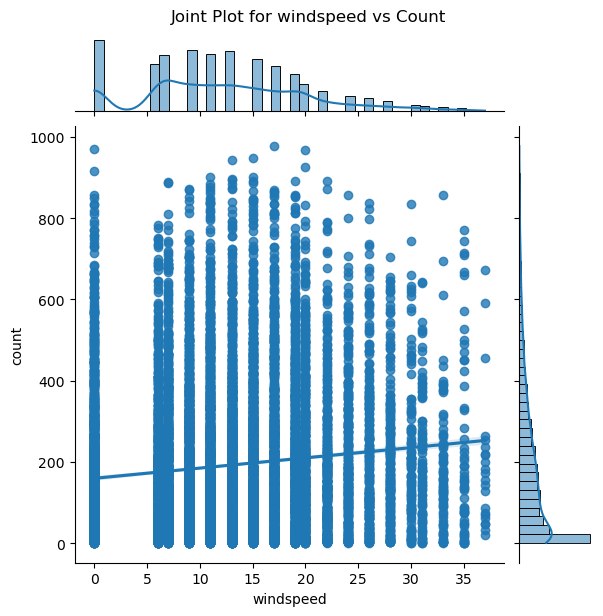

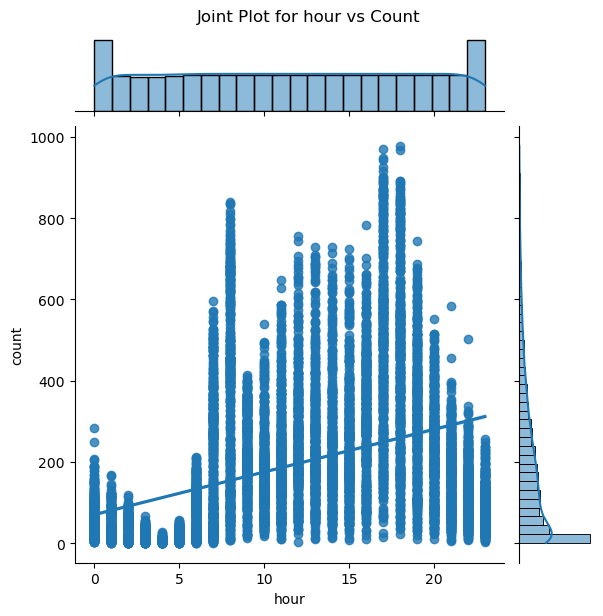

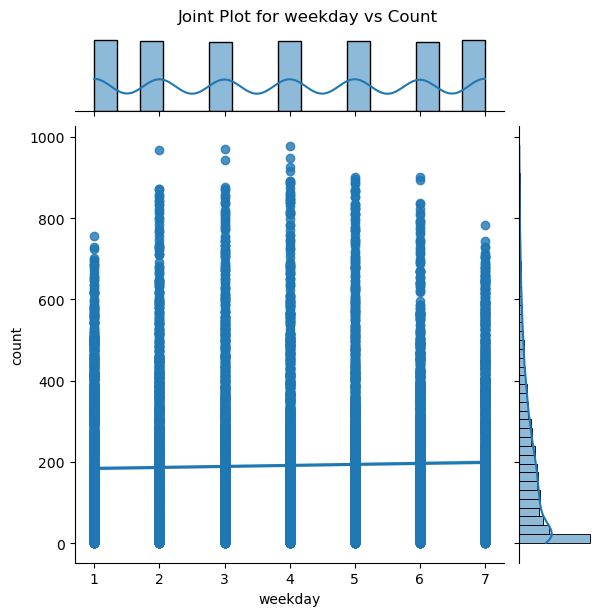

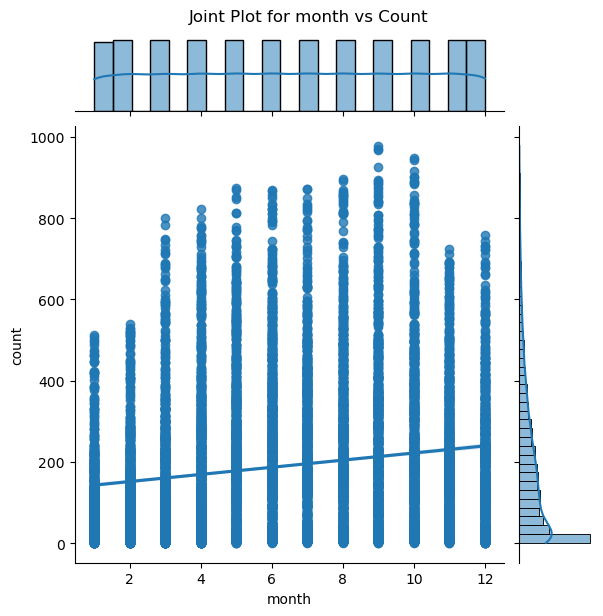

In [31]:
# Joint plots for numerical columns and count
for col in num_cols:
    sns.jointplot(x=col, y='count', data=df, kind='reg', height=6)
    plt.suptitle(f'Joint Plot for {col} vs Count', y=1.02)
    plt.show()


In another way, you can see how much rent we had on working days

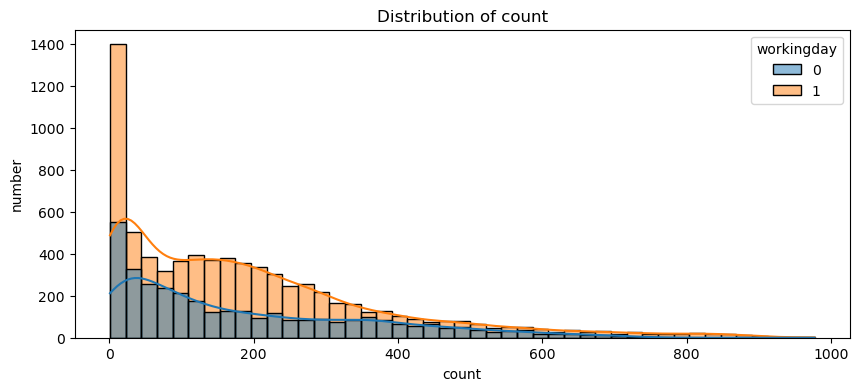

In [32]:
plt.figure(figsize=(10, 4))
sns.histplot(x=df['count'],hue=df['workingday'],kde=True, color='skyblue')
plt.title('Distribution of count')
plt.xlabel('count')
plt.ylabel('number')
plt.show()

Also for holidays

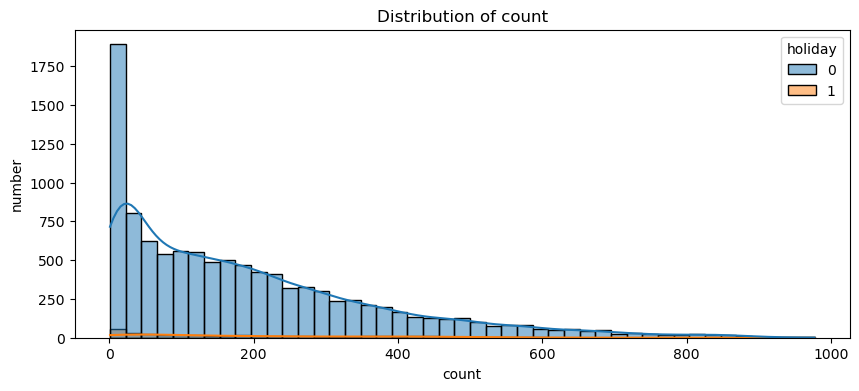

In [33]:
plt.figure(figsize=(10, 4))
sns.histplot(x=df['count'],hue=df['holiday'],kde=True, color='skyblue')
plt.title('Distribution of count')
plt.xlabel('count')
plt.ylabel('number')
plt.show()

How much rent did we have in each month of the year?

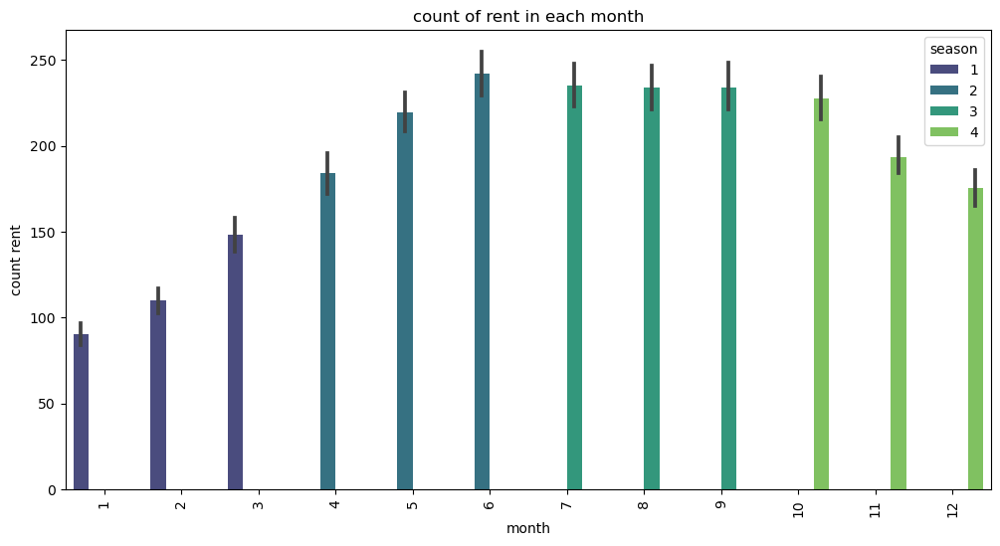

In [34]:
plt.figure(figsize=(12, 6))
sns.barplot(x='month', y='count', hue='season', data=df, palette='viridis', edgecolor=None, linewidth=0)
plt.title('count of rent in each month')
plt.xlabel('month')
plt.ylabel('count rent')
plt.xticks(rotation=90)
plt.show()

What is the wind speed in each month of the year?

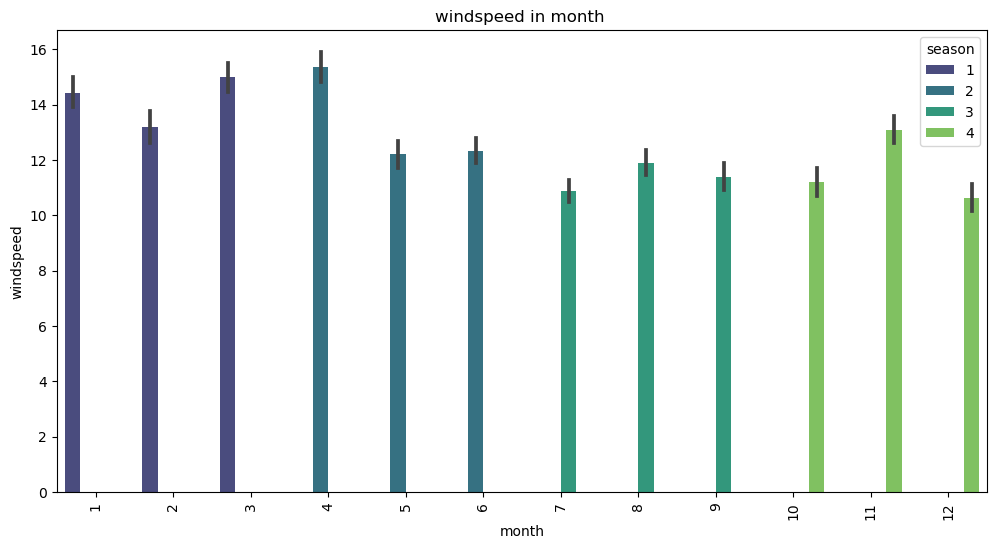

In [35]:
plt.figure(figsize=(12, 6))
sns.barplot(x='month',y='windspeed', data=df,hue='season', palette='viridis')
plt.title('windspeed in month ')
plt.xlabel('month')
plt.ylabel('windspeed')
plt.xticks(rotation=90)
plt.show()
sns.set_theme(style="darkgrid")

#### We will open this graph in full in the following, just to see in a general image how much rent we had in each hour of each month in relation to the air temperature.

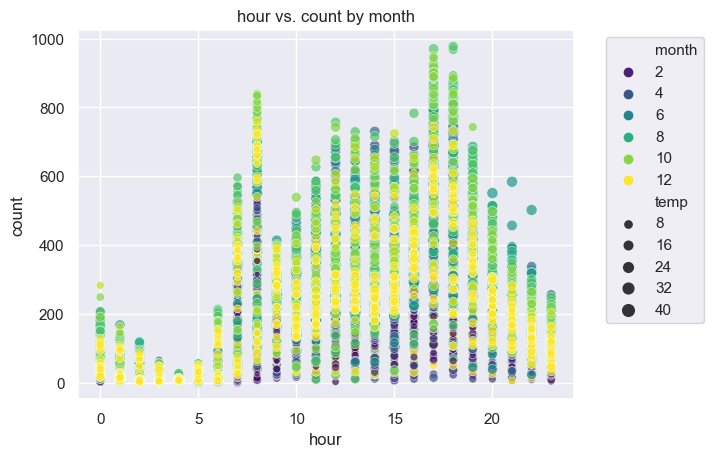

In [36]:
#plt.subplot(2, 1, 2)
sns.scatterplot(x='hour', y='count', hue='month',size='temp', data=df, palette='viridis', alpha=0.7)
plt.title('hour vs. count by month')
plt.xlabel('hour')
plt.ylabel('count')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

Let's look at the temperature in each month of each season and how the rent is compared to these two factors

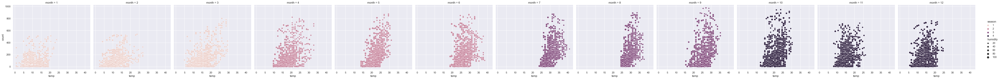

In [37]:
sns.relplot(x='temp',y='count',col='month',size='humidity',hue='season',data=df)

Let's look at the humidity in each month of each season and how the rent is compared to these two factors

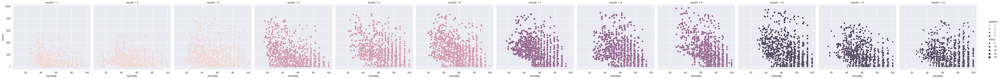

In [38]:
sns.relplot(x='humidity',y='count',col='month',size='temp',hue='season',data=df)

You can see how much the rent was in every weather and every hour
In my opinion, all the diagrams are readable and understandable to the required extent, and since analyzing these diagrams one by one takes a lot of time, I don't think it is necessary to analyze them all.

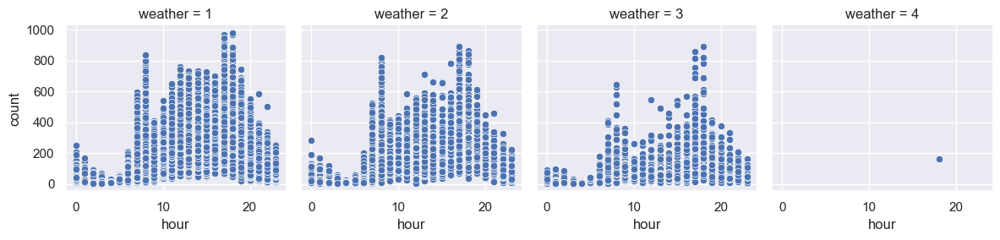

In [39]:
g = sns.FacetGrid(df, col="weather")
g.map_dataframe(sns.scatterplot, x="hour", y="count")

How much rent we had every weekday of every month in every weather

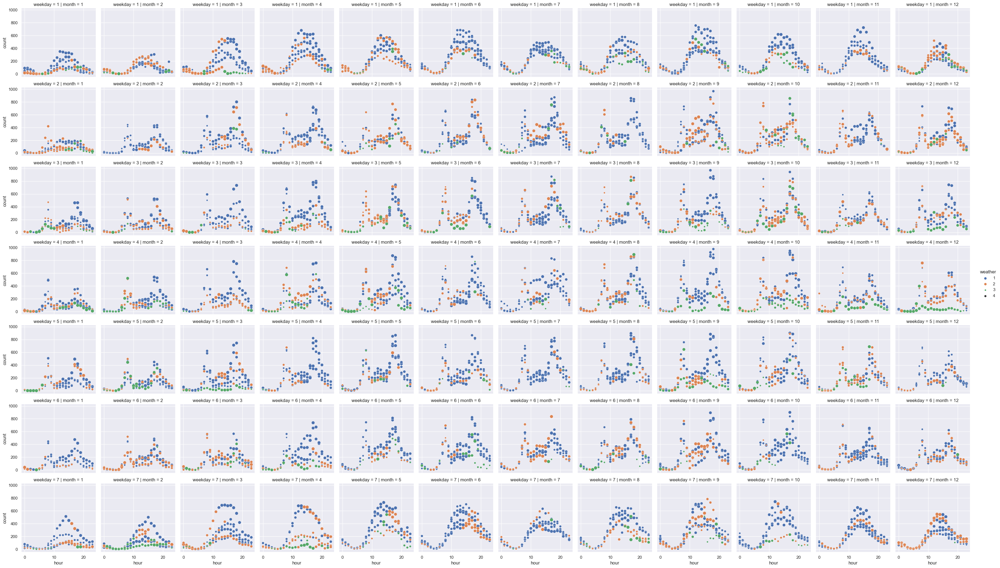

In [40]:
g = sns.FacetGrid(df, col="month",row='weekday',hue='weather')
g.map_dataframe(sns.scatterplot, x="hour", y="count",size='temp')
g.add_legend()

Display the amount of rent for each month and each weather in a different way

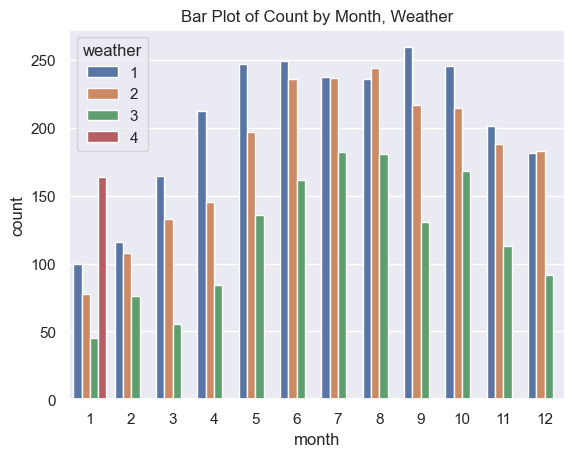

In [41]:
sns.barplot(data=df, x="month", y='count', hue='weather', ci=None)  # ci=None to suppress error bars
plt.title('Bar Plot of Count by Month, Weather')
plt.show()

Display the rental amount for each day of the week of each season

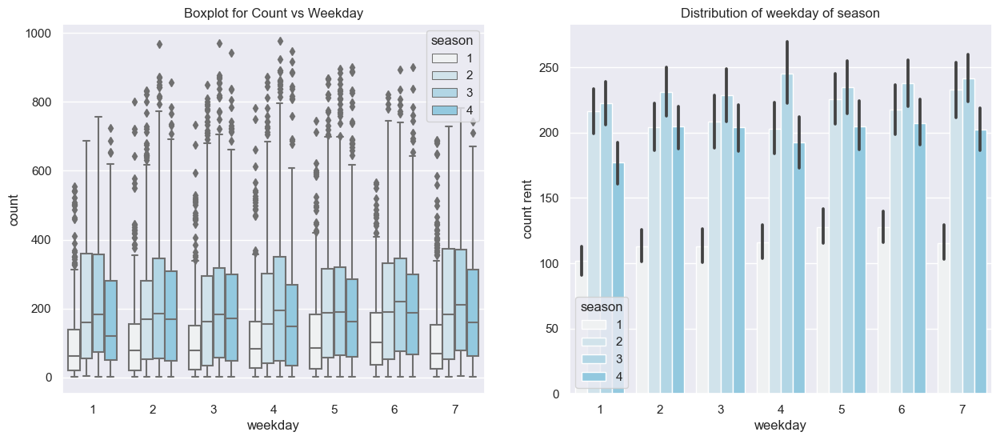

In [42]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 6))

sns.boxplot(x='weekday', y='count', hue='season', data=df, color='skyblue', ax=ax1)
ax1.set_title('Boxplot for Count vs Weekday')

sns.barplot(x='weekday', y='count', hue='season', data=df, color='skyblue', ax=ax2)
ax2.set_title('Barplot for Count vs Weekday')


plt.title('Distribution of weekday of season')
plt.xlabel('weekday')
plt.ylabel('count rent')
plt.show()

Here you can see the best temperature, humidity and weather conditions for the most rent in a much more general way

In [43]:
import plotly.express as px
fig = px.scatter_3d(df, x='temp', y='count', z='humidity', size='weather',color='month')
fig.update_traces(marker=dict(size=2))
fig.show()

## Train your model (Regression)

Now it's time to separate our data into two parts test and train in order to our model using it to predict count.

In [44]:
# Spliting target variable and independent variables
X = df.drop(['count'], axis = 1)
Y = df['count']

In [45]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, random_state = 4)

# 1-Multiple Linear Regression
Multiple linear regression is a statistical method used to model the linear relationship between a dependent variable and multiple independent variables. It is a type of regression analysis where the goal is to predict the value of a dependent variable based on the values of multiple independent variables. The dependent variable, denoted as Y, is the variable we want to predict or estimate. The independent variables, denoted as X1, X2, ..., Xn, are the variables that we believe have an influence on the dependent variable. The relationship between the dependent and independent variables is represented by the equation Y = β0 + β1X1 + β2X2 + ... + βnXn + ε, where β0 is the intercept term, β1, β2, ..., βn are the coefficients for each independent variable, and ε is the error term. The coefficients are estimated using a method such as Ordinary Least Squares (OLS), which minimizes the sum of squared differences between the observed values of the dependent variable and the predicted values given by the equation. Multiple linear regression is used in various fields such as economics, finance, biology, etc. It is important to keep in mind the assumptions of multiple linear regression such as linearity, independence, homoscedasticity, and normality, and to carefully interpret the results.

In [46]:
# Import library for Linear Regression
from sklearn.linear_model import LinearRegression

# Create a Linear regressor
mlr = LinearRegression()

# Train the model using the training sets 
mlr.fit(X_train, Y_train)

LinearRegression()

In [47]:
mlr.intercept_

-9.094947017729282e-13

In [48]:
mlr.coef_

array([-1.45034613e-15, -3.42281308e-13, -5.94014871e-14,  1.36716020e-14,
       -2.78021684e-15, -5.40690477e-16,  5.09375181e-16,  1.00000000e+00,
        1.00000000e+00, -7.69210785e-16,  9.18169413e-16, -4.07575484e-15])

Below you can see the coefficient of each feature

In [49]:
#Converting the coefficient values to a dataframe
pd.options.display.float_format = '{:,.30f}'.format
coeffcients = pd.DataFrame([X_train.columns,mlr.coef_]).T
coeffcients = coeffcients.rename(columns={0: 'Attribute', 1: 'Coefficients'})
coeffcients

,Attribute,Coefficients
0,season,-0.000000000000001450346133961876
1,holiday,-0.000000000000342281308250956847
2,workingday,-0.000000000000059401487116841365
3,weather,0.000000000000013671601954559793
4,temp,-0.000000000000002780216837581792
5,humidity,-0.000000000000000540690476521229
6,windspeed,0.000000000000000509375181395622
7,casual,0.999999999999999666933092612453
8,registered,1.000000000000006883382752675971
9,hour,-0.000000000000000769210785200375


In [50]:
# Model prediction on train and test data
Y_pred_ml = mlr.predict(X_train)
Y_pred_test_ml = mlr.predict(X_test)

**R-squared (R^2)** This metric represents the proportion of the variance for the dependent variable that is predictable from the independent variables. In other words, it measures how well the regression line approximates the real data points. The best value for R^2 is 1.0, which indicates that all the variance in the dependent variable can be predicted from the independent variables.

**Mean Absolute Error (MAE)**  This metric calculates the average of the absolute differences between the predicted values and the actual values. MAE is more robust to outliers than MSE, because it does not square the differences. The best value for MAE is 0, which means that all the predictions were perfectly accurate.
**Mean Squared Error (MSE)**  This metric calculates the average of the squared differences between the predicted values and the actual values. MSE penalizes larger errors more heavily than MAE because it squares the differences. The best value for MSE is 0, which means that all the predictions were perfectly accurate..

**Root Mean Squared Error (RMSE)**  This metric is the square root of MSE, which adjusts the scale of the metric to be more interpretable. Like MSE, RMSE penalizes larger errors more heavily than MAE because it squares the differences. The best value for RMSE is 0, which means that all the predictions were perfectly accurate.



In [51]:
from sklearn import metrics

As you can see, the results are very acceptable

In [52]:
# Model Evaluation
print('R^2 train:',metrics.r2_score(Y_train, Y_pred_ml))
print('MAE train:',metrics.mean_absolute_error(Y_train, Y_pred_ml))
print('MSE train:',metrics.mean_squared_error(Y_train, Y_pred_ml))
print('RMSE train:',np.sqrt(metrics.mean_squared_error(Y_train, Y_pred_ml)))
# Model Evaluation
print('R^2 test:',metrics.r2_score(Y_test, Y_pred_test_ml))
print('MAE test:',metrics.mean_absolute_error(Y_test, Y_pred_test_ml))
print('MSE test:',metrics.mean_squared_error(Y_test, Y_pred_test_ml))
print('RMSE test:',np.sqrt(metrics.mean_squared_error(Y_test, Y_pred_test_ml)))

R^2 train: 1.0
MAE train: 7.719746685000584e-13
MSE train: 1.0508736538873543e-24
RMSE train: 1.0251212874032781e-12
R^2 test: 1.0
MAE test: 7.793997127626642e-13
MSE test: 1.0792586941104552e-24
RMSE test: 1.0388737623553958e-12


In a unique way, the prediction and the reality match each other, obviously this is not so accurate in reality

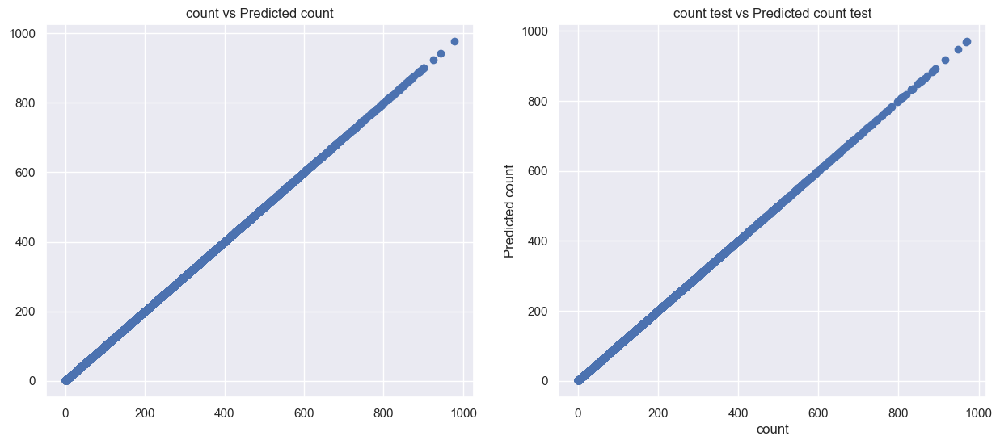

In [54]:
# Visualizing the differences between actual prices and predicted values
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 6))
ax1.scatter(Y_train, Y_pred_ml)
ax2.scatter(Y_test, Y_pred_test_ml)
plt.xlabel("count")
plt.ylabel("Predicted count")
ax1.set_title("count vs Predicted count")
ax2.set_title("count test vs Predicted count test")
plt.show()


#### The error rate is also very, very low. As you can see, almost all the error rates are close to zero or the maximum of 1

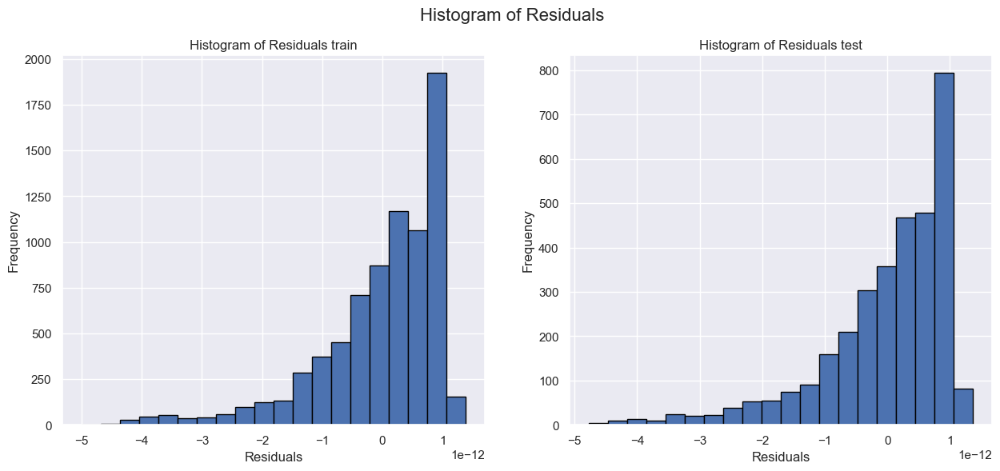

In [56]:

# assuming your data is in arrays Y_train, Y_pred, Y_test, and Y_pred_test
Y_train_residuals = Y_train - Y_pred_ml
Y_test_residuals = Y_test - Y_pred_test_ml

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 6))

ax1.hist(Y_train_residuals, bins=20, edgecolor='black')
ax1.set_title("Histogram of Residuals train")
ax1.set_xlabel("Residuals")
ax1.set_ylabel("Frequency")

ax2.hist(Y_test_residuals, bins=20, edgecolor='black')
ax2.set_title("Histogram of Residuals test")
ax2.set_xlabel("Residuals")
ax2.set_ylabel("Frequency")

plt.suptitle("Histogram of Residuals", fontsize=16)
plt.show()

# 2- Polynomial
#### 1-Multiple Linear Regression is a machine learning model in Python that extends the simple linear regression model to handle multiple independent variables. The model assumes a linear relationship between the dependent variable and one or more independent variables. The model can be represented by the equation f(x) = b0 + b1x1 + b2x2 + ... + bn*xn, where f(x) is the predicted value of the dependent variable, x1, x2, ..., xn are the independent variables, and b0, b1, b2, ..., bn are the regression coefficients. The regression coefficients are estimated using a technique called least squares, which minimizes the sum of the squared differences between the actual and predicted values of the dependent variable.
#### 2-The steps for implementing a Polynomial machine learning model in Python are as follows:
* Import the necessary libraries and dataset
* Preprocess the dataset by splitting it into features (X) and target (y)
* Fit a polynomial regression model to the data using the fit() function
* Make predictions using the predict() function
* Evaluate the performance of the model using appropriate metrics
#### 3- The Polynomial machine learning model in Python works by adding higher-degree polynomial terms to the feature space. This allows the model to capture non-linear patterns in the data. The degree of the polynomial can be adjusted to balance the trade-off between model complexity and overfitting. The model is still linear in terms of the coefficients, so the least squares technique can still be used to estimate the coefficients. The model can be regularized using techniques such as Lasso or Ridge regression to prevent overfitting. The model can be visualized using scatter plots or other visualization techniques to gain insights into the relationship between the independent and

We also test other models to see if they have the same prediction or not. Our next model is polynomial.

In [57]:
from sklearn.preprocessing import PolynomialFeatures

We use the second degree and you will understand why

In [58]:
poly_feature=PolynomialFeatures(degree=2)
X_train_poly=poly_feature.fit_transform(X_train)
lr_poly=LinearRegression()
lr_poly.fit(X_train_poly,Y_train)
Y_train_predc_poly=lr_poly.predict(X_train_poly)
Y_test_predc_poly=lr_poly.predict(poly_feature.fit_transform(X_test))

As you can see in the graph of the error rate of each degrees, you will notice that we have the lowest amount of error in degrees 1 and 2 and it is even better to use 1 degree.

Best degree 1 with RMSE 1.033408938391454e-12


Text(0, 0.5, 'RMSE')

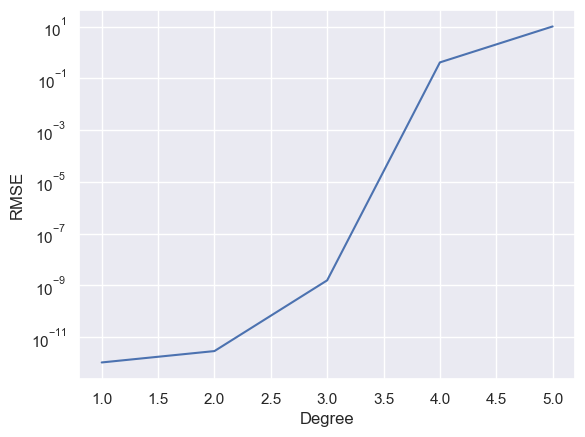

In [59]:
from sklearn.metrics import mean_squared_error
rmses = []
degrees = np.arange(1, 6)
min_rmse, min_deg = 1e10, 0

for deg in degrees:

    # Train features
    poly_features = PolynomialFeatures(degree=deg, include_bias=False)
    X_poly_train = poly_features.fit_transform(X_train)

    # Linear regression
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly_train, Y_train)

    # Compare with test data
    X_poly_test = poly_features.fit_transform(X_test)
    poly_predict = poly_reg.predict(X_poly_test)
    poly_mse = mean_squared_error(Y_test, poly_predict)
    poly_rmse = np.sqrt(poly_mse)
    rmses.append(poly_rmse)
    
    # Cross-validation of degree
    if min_rmse > poly_rmse:
        min_rmse = poly_rmse
        min_deg = deg

# Plot and present results
print('Best degree {} with RMSE {}'.format(min_deg, min_rmse))
        
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(degrees, rmses)
ax.set_yscale('log')
ax.set_xlabel('Degree')
ax.set_ylabel('RMSE')

Here too, by observing the amount of errors, you can see that our model has worked very well

In [60]:

# Model Evaluation
print('R^2 train:',metrics.r2_score(Y_train, Y_train_predc_poly))
print('MAE train:',metrics.mean_absolute_error(Y_train, Y_train_predc_poly))
print('MSE train:',metrics.mean_squared_error(Y_train, Y_train_predc_poly))
print('RMSE train:',np.sqrt(metrics.mean_squared_error(Y_train, Y_train_predc_poly)))
# Model Evaluation


R^2 train: 1.0
MAE train: 2.0917210949615897e-12
MSE train: 8.562240773748829e-24
RMSE train: 2.9261306829580984e-12


In [61]:

print('R^2 test:',metrics.r2_score(Y_test, Y_test_predc_poly))
print('MAE test:',metrics.mean_absolute_error(Y_test, Y_test_predc_poly))
print('MSE test:',metrics.mean_squared_error(Y_test, Y_test_predc_poly))
print('RMSE test:',np.sqrt(metrics.mean_squared_error(Y_test, Y_test_predc_poly)))

R^2 test: 1.0
MAE test: 2.100160591123764e-12
MSE test: 8.966832308368225e-24
RMSE test: 2.9944669489523884e-12


# 3- KNN Regressor
K-Nearest Neighbors (KNN) is a machine learning algorithm that can be used for both classification and regression tasks. KNN works by finding the k nearest neighbors to the new, unlabeled data and making a prediction of the value or class that the new data point belongs to 1.

The next model is knn. We use two neighbors to build our model

In [62]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=2)
neigh.fit(X_train, Y_train)
Y_train_predc_knnreg=neigh.predict(X_train)
Y_test_predc_knnreg=neigh.predict(X_test)

#### In the plot below, you can see that almost two neighbors is the best choice because both the most and the test have reasonable scores.

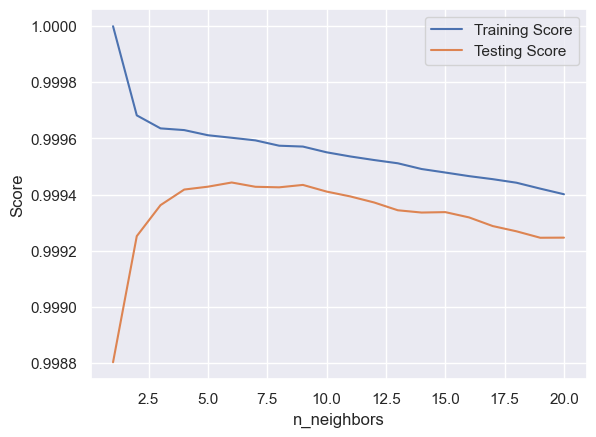

In [63]:
# Define the range of n_neighbors to test
n_neighbors_range = range(1, 21)

# Train the model for each value of n_neighbors and compute the training and testing scores
train_scores = []
test_scores = []
for n_neighbors in n_neighbors_range:
    neigh = KNeighborsRegressor(n_neighbors=n_neighbors)
    neigh.fit(X_train, Y_train)
    train_scores.append(neigh.score(X_train, Y_train))
    test_scores.append(neigh.score(X_test, Y_test))

# Plot the training and testing scores as a function of n_neighbors
plt.plot(n_neighbors_range, train_scores, label='Training Score')
plt.plot(n_neighbors_range, test_scores, label='Testing Score')
plt.xlabel('n_neighbors')
plt.ylabel('Score')
plt.legend()
plt.show()


#### You can see the amount of errors, as you can see, this model has performed weaker than the previous two models

In [64]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate MSE, RMSE, MAE, and R^2 for training set
mse_train = mean_squared_error(Y_train, Y_train_predc_knnreg)
rmse_train = mean_squared_error(Y_train, Y_train_predc_knnreg, squared=False)
mae_train = mean_absolute_error(Y_train, Y_train_predc_knnreg)
r2_train = r2_score(Y_train, Y_train_predc_knnreg)

# Calculate MSE, RMSE, MAE, and R^2 for test set
mse_test = mean_squared_error(Y_test, Y_test_predc_knnreg)
rmse_test = mean_squared_error(Y_test, Y_test_predc_knnreg, squared=False)
mae_test = mean_absolute_error(Y_test, Y_test_predc_knnreg)
r2_test = r2_score(Y_test, Y_test_predc_knnreg)

print(f"Training set metrics: MSE={mse_train}, RMSE={rmse_train}, MAE={mae_train}, R^2={r2_train}")
print(f"Test set metrics: MSE={mse_test}, RMSE={rmse_test}, MAE={mae_test}, R^2={r2_test}")

Training set metrics: MSE=10.32490157480315, RMSE=3.2132384870723727, MAE=2.36003937007874, R^2=0.9996823661281701
Test set metrics: MSE=25.07769442743417, RMSE=5.007763415681113, MAE=3.665186772810778, R^2=0.9992518806108984


# 4-Decision Tree Regressor
* Decision Tree Regressor: A decision tree regressor is a type of supervised learning algorithm that is used to predict a continuous outcome variable. It works by recursively partitioning the predictor space into a series of rectangular regions, and then fitting a simple model (such as a constant or a linear function) to the data within each region. The final prediction for a new observation is obtained by traversing the tree from the root to a leaf node, and then evaluating the model at that node.


Let's try the next attractive model called Decision Tree Regressor

In [65]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor  
  
# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0)  
  
# fit the regressor with X and Y data 
regressor.fit(X_train, Y_train) 

  
Y_train_pred_tree = regressor.predict(X_train) 
Y_test_pred_tree = regressor.predict(X_test) 


### This model does not give us interesting results in the test section

In [66]:
# Compute the mean squared error
mse = mean_squared_error(Y_test, Y_test_pred_tree)
mse_train = mean_squared_error(Y_train, Y_train_pred_tree)

# Compute the mean absolute error
mae = mean_absolute_error(Y_test, Y_test_pred_tree)
mae_train = mean_absolute_error(Y_train, Y_train_pred_tree)

# Compute the coefficient of determination (R^2 score)
r2 = r2_score(Y_test, Y_test_pred_tree)
r2_train = r2_score(Y_train, Y_train_pred_tree)

print(f"Mean Squared Error test: {mse:.2f}")
print(f"Mean Absolute Error test: {mae:.2f}")
print(f"R^2 Score test: {r2:.2f}")
print(f"Mean Squared Error train: {mse_train:.2f}")
print(f"Mean Absolute Error train: {mae_train:.2f}")
print(f"R^2 Score train: {r2_train:.2f}")

Mean Squared Error test: 36.31
Mean Absolute Error test: 2.94
R^2 Score test: 1.00
Mean Squared Error train: 0.00
Mean Absolute Error train: 0.00
R^2 Score train: 1.00


### Let's see how this model works in this data

In [67]:
from sklearn.tree import export_graphviz
import graphviz

# Export the decision tree to a DOT file
dot_data = export_graphviz(regressor, out_file=None, 
                           feature_names=X_train.columns,  
                           filled=True, rounded=True,  
                           special_characters=True)  

# Create a graph from the DOT data
graph = graphviz.Source(dot_data)  

# Save the graph as a PNG file or display it
graph.render("decision_tree",view=True)
# Alternatively, you can display the graph directly in a Jupyter notebook
# graph.render("decision_tree", view=True)


'decision_tree.pdf'

# 5-Random Forest Regression
Random Forest Regression is a popular machine learning algorithm used for regression problems, where the goal is to predict a continuous outcome. It is a type of ensemble learning method that builds multiple decision trees and combines their predictions to produce a more accurate and stable prediction. The key idea behind Random Forest Regression is to decorrelate the trees by introducing randomness in the tree-growing process. This is achieved by selecting a random subset of predictors at each split, which reduces the correlation between the trees and improves the overall performance of the model.

The basic algorithm for a regression Random Forest can be summarized as follows:

* 1-Given a training dataset
* 2-Select the number of trees to build (ntrees)
* 3-For i = 1 to ntrees do
* 4-Generate a bootstrap sample of the original data
* 5-Grow a regression tree to the bootstrapped data
* 6-For each split, select m variables at random from all p variables
* 7-Pick the best variable/split-point among the m
* 8-Split the node into two child nodes
* 9-Use typical tree model stopping criteria to determine when a tree is complete (but do not prune)
* 10-End
#### Random Forest Regression has several advantages over other regression algorithms, including:

* It is less prone to overfitting than a single decision tree, as it averages the predictions of many trees.
* It can handle a large number of predictors without becoming computationally expensive.
* It can handle both numerical and categorical predictors.
* It provides an out-of-bag (OOB) sample that provides an efficient and reasonable approximation of the test error.
#### However, Random Forest Regression also has some disadvantages, including:

* It can be computationally expensive for large datasets.
* It can be difficult to interpret the results, as the predictions are based on the average of many trees.
* It does not provide a simple model formula that can be easily interpreted.

### The last model we will check together is called Random Forest Regression

In [68]:
from sklearn.ensemble import RandomForestRegressor
# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf.fit(X_train, Y_train)

# Make predictions on the testing subset
Y_test_pred_rf = rf.predict(X_test)
Y_train_pred_rf = rf.predict(X_train)

In [69]:
# Evaluate the model using Mean Squared Error (MSE)
# Compute the mean squared error
mse = mean_squared_error(Y_test, Y_test_pred_rf)
mse_train = mean_squared_error(Y_train, Y_train_pred_rf)

# Compute the mean absolute error
mae = mean_absolute_error(Y_test, Y_test_pred_rf)
mae_train = mean_absolute_error(Y_train, Y_train_pred_rf)

# Compute the coefficient of determination (R^2 score)
r2 = r2_score(Y_test, Y_test_pred_rf)
r2_train = r2_score(Y_train, Y_train_pred_rf)

print(f"Mean Squared Error test: {mse:.2f}")
print(f"Mean Absolute Error test: {mae:.2f}")
print(f"R^2 Score test: {r2:.2f}")
print(f"Mean Squared Error train: {mse_train:.2f}")
print(f"Mean Absolute Error train: {mae_train:.2f}")
print(f"R^2 Score train: {r2_train:.2f}")

Mean Squared Error test: 10.18
Mean Absolute Error test: 1.31
R^2 Score test: 1.00
Mean Squared Error train: 1.70
Mean Absolute Error train: 0.53
R^2 Score train: 1.00


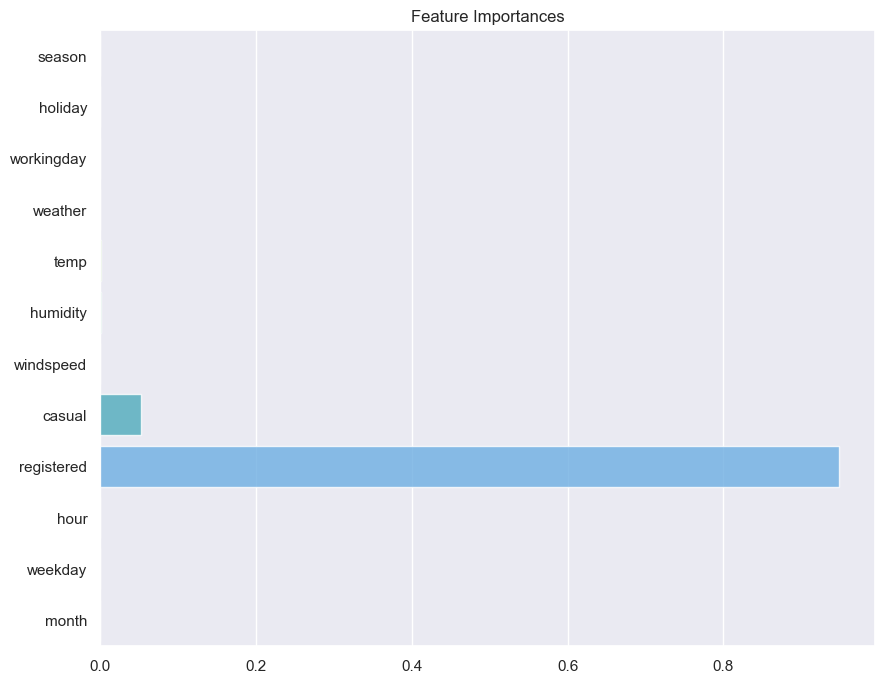

In [70]:
# Visualize the feature importances
coefficients = rf.feature_importances_
names = X.columns

plt.figure(figsize=(10, 8))
sns.barplot(x=coefficients, y=names, alpha=0.8)
plt.title('Feature Importances')
plt.show()

## Test Result

Now that we have finished training the model, we enter the test data and do all the required pre-processing as before

In [71]:
df_test=pd.read_csv('C:/Users/pc/Downloads/Video/Mini Project 2 - Regression (Bike Sharing Demand)/test.csv')
df_test

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed
0,2011-01-20 00:00:00,1,0,1,1,10.660000000000000142108547152020,11.365000000000000213162820728030,56,26.002700000000000812860889709555
1,2011-01-20 01:00:00,1,0,1,1,10.660000000000000142108547152020,13.634999999999999786837179271970,56,0.000000000000000000000000000000
2,2011-01-20 02:00:00,1,0,1,1,10.660000000000000142108547152020,13.634999999999999786837179271970,56,0.000000000000000000000000000000
3,2011-01-20 03:00:00,1,0,1,1,10.660000000000000142108547152020,12.880000000000000781597009336110,56,11.001400000000000289901436190121
4,2011-01-20 04:00:00,1,0,1,1,10.660000000000000142108547152020,12.880000000000000781597009336110,56,11.001400000000000289901436190121
...,...,...,...,...,...,...,...,...,...
6488,2012-12-31 19:00:00,1,0,1,2,10.660000000000000142108547152020,12.880000000000000781597009336110,60,11.001400000000000289901436190121
6489,2012-12-31 20:00:00,1,0,1,2,10.660000000000000142108547152020,12.880000000000000781597009336110,60,11.001400000000000289901436190121
6490,2012-12-31 21:00:00,1,0,1,1,10.660000000000000142108547152020,12.880000000000000781597009336110,60,11.001400000000000289901436190121
6491,2012-12-31 22:00:00,1,0,1,1,10.660000000000000142108547152020,13.634999999999999786837179271970,56,8.998100000000000875388650456443


In [72]:
rows, columns = df_test.shape
print(f"تعداد ردیف‌ها: {rows}, تعداد ستون‌ها: {columns}")

تعداد ردیف‌ها: 6493, تعداد ستون‌ها: 9


In [73]:
for colunm in df_test.columns:
    uniq=df_test[colunm].nunique()
    print (f'{colunm}: {uniq} مقدار یکتا')

datetime: 6493 مقدار یکتا
season: 4 مقدار یکتا
holiday: 2 مقدار یکتا
workingday: 2 مقدار یکتا
weather: 4 مقدار یکتا
temp: 49 مقدار یکتا
atemp: 65 مقدار یکتا
humidity: 79 مقدار یکتا
windspeed: 27 مقدار یکتا


As before, we separate the hours and days of the week and month from datetime

In [74]:
df_test["date"] = df_test.datetime.apply(lambda x: x.split()[0])
df_test["hour"] = df_test.datetime.apply(lambda x: x.split()[1].split(":")[0])

# Adjust the weekday calculation
df_test["weekday"] = df_test.date.apply(lambda dateString: (datetime.strptime(dateString, "%Y-%m-%d").weekday() + 1) % 7 + 1)

# 1 for Sunday, 2 for Monday, ..., 7 for Saturday
df_test["month"] = df_test.date.apply(lambda dateString: datetime.strptime(dateString, "%Y-%m-%d").month)

In [75]:
df_test['date'] = pd.to_datetime(df_test['date'])
# convert the datetime column to an integer column
df_test['date'] = df_test['date'].astype(np.int64)
# Convert 'hour' column to float type
df_test['hour'] = df_test['hour'].astype(int)

In [76]:
df_test

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,date,hour,weekday,month
0,2011-01-20 00:00:00,1,0,1,1,10.660000000000000142108547152020,11.365000000000000213162820728030,56,26.002700000000000812860889709555,1295481600000000000,0,5,1
1,2011-01-20 01:00:00,1,0,1,1,10.660000000000000142108547152020,13.634999999999999786837179271970,56,0.000000000000000000000000000000,1295481600000000000,1,5,1
2,2011-01-20 02:00:00,1,0,1,1,10.660000000000000142108547152020,13.634999999999999786837179271970,56,0.000000000000000000000000000000,1295481600000000000,2,5,1
3,2011-01-20 03:00:00,1,0,1,1,10.660000000000000142108547152020,12.880000000000000781597009336110,56,11.001400000000000289901436190121,1295481600000000000,3,5,1
4,2011-01-20 04:00:00,1,0,1,1,10.660000000000000142108547152020,12.880000000000000781597009336110,56,11.001400000000000289901436190121,1295481600000000000,4,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,2012-12-31 19:00:00,1,0,1,2,10.660000000000000142108547152020,12.880000000000000781597009336110,60,11.001400000000000289901436190121,1356912000000000000,19,2,12
6489,2012-12-31 20:00:00,1,0,1,2,10.660000000000000142108547152020,12.880000000000000781597009336110,60,11.001400000000000289901436190121,1356912000000000000,20,2,12
6490,2012-12-31 21:00:00,1,0,1,1,10.660000000000000142108547152020,12.880000000000000781597009336110,60,11.001400000000000289901436190121,1356912000000000000,21,2,12
6491,2012-12-31 22:00:00,1,0,1,1,10.660000000000000142108547152020,13.634999999999999786837179271970,56,8.998100000000000875388650456443,1356912000000000000,22,2,12


We delete extra data

In [77]:
df_test.drop(['datetime','date','atemp'],axis=1,inplace=True)
df_test

,season,holiday,workingday,weather,temp,humidity,windspeed,hour,weekday,month
0,1,0,1,1,10.660000000000000142108547152020,56,26.002700000000000812860889709555,0,5,1
1,1,0,1,1,10.660000000000000142108547152020,56,0.000000000000000000000000000000,1,5,1
2,1,0,1,1,10.660000000000000142108547152020,56,0.000000000000000000000000000000,2,5,1
3,1,0,1,1,10.660000000000000142108547152020,56,11.001400000000000289901436190121,3,5,1
4,1,0,1,1,10.660000000000000142108547152020,56,11.001400000000000289901436190121,4,5,1
...,...,...,...,...,...,...,...,...,...,...
6488,1,0,1,2,10.660000000000000142108547152020,60,11.001400000000000289901436190121,19,2,12
6489,1,0,1,2,10.660000000000000142108547152020,60,11.001400000000000289901436190121,20,2,12
6490,1,0,1,1,10.660000000000000142108547152020,60,11.001400000000000289901436190121,21,2,12
6491,1,0,1,1,10.660000000000000142108547152020,56,8.998100000000000875388650456443,22,2,12


In [78]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6493 entries, 0 to 6492
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      6493 non-null   int64  
 1   holiday     6493 non-null   int64  
 2   workingday  6493 non-null   int64  
 3   weather     6493 non-null   int64  
 4   temp        6493 non-null   float64
 5   humidity    6493 non-null   int64  
 6   windspeed   6493 non-null   float64
 7   hour        6493 non-null   int32  
 8   weekday     6493 non-null   int64  
 9   month       6493 non-null   int64  
dtypes: float64(2), int32(1), int64(7)
memory usage: 482.0 KB


Removal of outliers

In [79]:
from scipy import stats
# Define a list of columns to work on
columns = ['temp', 'humidity','windspeed']
# Calculate the z-scores of each column in the list
z_scores = stats.zscore(df_test[columns])
# Find the absolute z-scores greater than 3
outliers = np.abs(z_scores) > 3
# Replace the outliers with the median of the column
df_test[outliers] = np.nan
df_test.fillna(df.median(), inplace=True)

# Print the cleaned dataframe
df_test

,season,holiday,workingday,weather,temp,humidity,windspeed,hour,weekday,month
0,1,0,1,1,10.660000000000000142108547152020,56,26.002700000000000812860889709555,0,5,1
1,1,0,1,1,10.660000000000000142108547152020,56,0.000000000000000000000000000000,1,5,1
2,1,0,1,1,10.660000000000000142108547152020,56,0.000000000000000000000000000000,2,5,1
3,1,0,1,1,10.660000000000000142108547152020,56,11.001400000000000289901436190121,3,5,1
4,1,0,1,1,10.660000000000000142108547152020,56,11.001400000000000289901436190121,4,5,1
...,...,...,...,...,...,...,...,...,...,...
6488,1,0,1,2,10.660000000000000142108547152020,60,11.001400000000000289901436190121,19,2,12
6489,1,0,1,2,10.660000000000000142108547152020,60,11.001400000000000289901436190121,20,2,12
6490,1,0,1,1,10.660000000000000142108547152020,60,11.001400000000000289901436190121,21,2,12
6491,1,0,1,1,10.660000000000000142108547152020,56,8.998100000000000875388650456443,22,2,12


In [80]:
df_test.isnull().sum()

season        0
holiday       0
workingday    0
weather       0
temp          0
humidity      0
windspeed     0
hour          0
weekday       0
month         0
dtype: int64

For better readability, display up to 2 decimal places

In [81]:
pd.set_option('display.float_format', '{:.2f}'.format)
df_test

,season,holiday,workingday,weather,temp,humidity,windspeed,hour,weekday,month
0,1,0,1,1,10.66,56,26.00,0,5,1
1,1,0,1,1,10.66,56,0.00,1,5,1
2,1,0,1,1,10.66,56,0.00,2,5,1
3,1,0,1,1,10.66,56,11.00,3,5,1
4,1,0,1,1,10.66,56,11.00,4,5,1
...,...,...,...,...,...,...,...,...,...,...
6488,1,0,1,2,10.66,60,11.00,19,2,12
6489,1,0,1,2,10.66,60,11.00,20,2,12
6490,1,0,1,1,10.66,60,11.00,21,2,12
6491,1,0,1,1,10.66,56,9.00,22,2,12


### Since we don't have the two columns 'casual' and 'registered' in the test data, while we have built our model using these two in the most data, we create a random value using the mean and std. Two columns in train data
This makes these two columns look more like reality and point in the direction of our datatrain

In [82]:
# Assuming df_train is your training DataFrame
mean_casual = df['casual'].mean()
std_casual = df['casual'].std()

mean_registered = df['registered'].mean()
std_registered = df['registered'].std()

# Assuming df_test is your testing DataFrame
# Generate random values for 'casual' and 'registered' in df_test
df_test['casual'] = np.random.normal(mean_casual, std_casual, len(df_test))
df_test['registered'] = np.random.normal(mean_registered, std_registered, len(df_test))


We arrange our columns like train data to avoid possible errors

In [83]:
 df_test = df_test [ ['season', 'holiday', 'workingday', 'weather', 'temp',
       'humidity', 'windspeed', 'casual', 'registered', 'hour',
       'weekday', 'month']]

In [84]:
df_test

,season,holiday,workingday,weather,temp,humidity,windspeed,casual,registered,hour,weekday,month
0,1,0,1,1,10.66,56,26.00,-19.75,301.24,0,5,1
1,1,0,1,1,10.66,56,0.00,69.10,151.76,1,5,1
2,1,0,1,1,10.66,56,0.00,-25.88,106.96,2,5,1
3,1,0,1,1,10.66,56,11.00,47.88,153.90,3,5,1
4,1,0,1,1,10.66,56,11.00,74.57,120.52,4,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1,0,1,2,10.66,60,11.00,44.31,468.91,19,2,12
6489,1,0,1,2,10.66,60,11.00,19.10,-40.89,20,2,12
6490,1,0,1,1,10.66,60,11.00,85.44,73.64,21,2,12
6491,1,0,1,1,10.66,56,9.00,96.02,391.53,22,2,12


In [85]:
X = df_test[df_test.columns]

In [86]:
Y_pred_tree = regressor.predict(X)
Y_pred_tree

array([300., 223., 107., ..., 196., 473.,   1.])

In [87]:
Y_predc_poly=lr_poly.predict(poly_feature.fit_transform(X))
Y_predc_poly

array([281.48848615, 220.86358913,  81.08110866, ..., 159.07993579,
       487.54948   , -60.61897608])

In [88]:
Y_pred_multiple = mlr.predict(X)
Y_pred_multiple

array([281.48848615, 220.86358913,  81.08110866, ..., 159.07993579,
       487.54948   , -60.61897608])

In [89]:
df_test.loc[:, 'count'] = Y_pred_multiple
df_test

,season,holiday,workingday,weather,temp,humidity,windspeed,casual,registered,hour,weekday,month,count
0,1,0,1,1,10.66,56,26.00,-19.75,301.24,0,5,1,281.49
1,1,0,1,1,10.66,56,0.00,69.10,151.76,1,5,1,220.86
2,1,0,1,1,10.66,56,0.00,-25.88,106.96,2,5,1,81.08
3,1,0,1,1,10.66,56,11.00,47.88,153.90,3,5,1,201.78
4,1,0,1,1,10.66,56,11.00,74.57,120.52,4,5,1,195.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1,0,1,2,10.66,60,11.00,44.31,468.91,19,2,12,513.22
6489,1,0,1,2,10.66,60,11.00,19.10,-40.89,20,2,12,-21.78
6490,1,0,1,1,10.66,60,11.00,85.44,73.64,21,2,12,159.08
6491,1,0,1,1,10.66,56,9.00,96.02,391.53,22,2,12,487.55
